Loading image...
Applying Top-Hat filter with disk size 10...


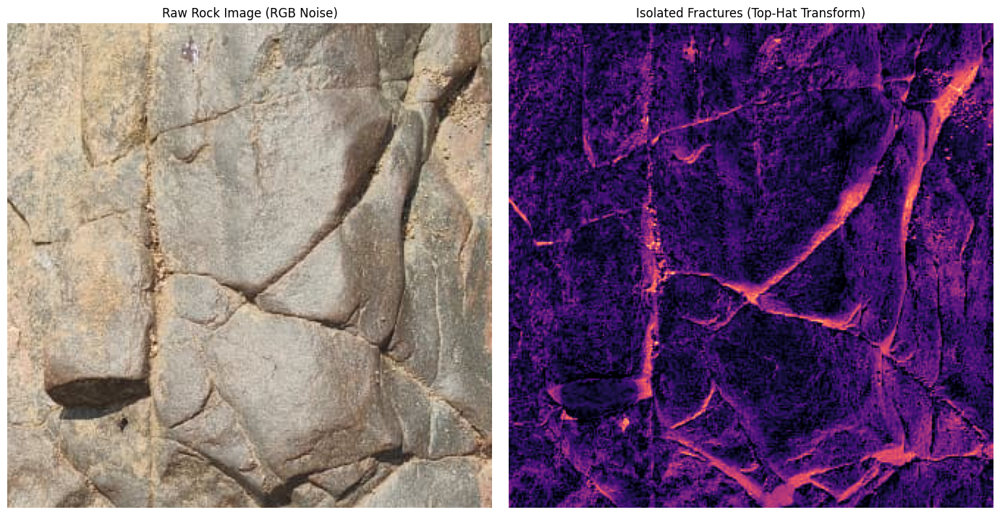

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import black_tophat, disk
from skimage.color import rgb2gray
from skimage import io

def isolate_fractures(image_path, disk_size=15):
    """
    Applies a Morphological Black Top-Hat transform to isolate
    dark, narrow fractures from a noisy rock background.
    """
    # 1. Load the raw field image
    print("Loading image...")
    # Using skimage.io as it handles color channels well for scientific images
    raw_image = io.imread(image_path)

    # 2. Convert to Grayscale
    # Topology algorithms don't need color; they need intensity.
    gray_image = rgb2gray(raw_image)

    # 3. Define the Structuring Element
    # The 'disk_size' is your most important parameter.
    # If fractures are 5 pixels wide, a disk of 10-15 works perfectly.
    print(f"Applying Top-Hat filter with disk size {disk_size}...")
    footprint = disk(disk_size)

    # 4. Execute the Black Top-Hat Transform
    # This subtracts the background illumination and isolates the dark valleys.
    isolated_fractures = black_tophat(gray_image, footprint)

    # 5. Enhance the Contrast (Optional but helpful for visibility)
    # We normalize the output so the fractures glow brightly against the black matrix
    isolated_fractures = isolated_fractures / np.max(isolated_fractures)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 2, figsize=(14, 7))

    axes[0].imshow(raw_image)
    axes[0].set_title('Raw Rock Image (RGB Noise)')
    axes[0].axis('off')

    # We display the output in a 'hot' colormap to clearly see the intensity of the isolated structures
    axes[1].imshow(isolated_fractures, cmap='magma')
    axes[1].set_title('Isolated Fractures (Top-Hat Transform)')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    return isolated_fractures

# --- Execution ---
# Replace 'test_rock.jpg' with the actual path to one of your 25 field photos
if __name__ == "__main__":
    # Start with a disk size of 15. If it captures too much noise, lower it to 10.
    # If it misses thick fractures, increase it to 25.
    result = isolate_fractures('/content/sample_data/STN_003_REF_Crop_1.tif', disk_size=10)

In [ ]:
pip install phasepack

  Preparing metadata (setup.py) ... done
  Created wheel for phasepack: filename=phasepack-1.5-py3-none-any.whl size=26961 sha256=6406b2d82e5e7a6dbf4683ae89fe8fa1793da4080c4c2ecfae9b9c2fe9458e59
  Stored in directory: /root/.cache/pip/wheels/cd/e1/88/0e0f58e2de2c0cedd705a04d2fd8f6bbae1e4061695cf3e18d
Successfully built phasepack


Loading /content/sample_data/STN_003_REF_Crop_1.tif...
Executing Top-Hat Transform...
Executing Phase Congruency (This may take a moment)...
Cleaning noise and Skeletonizing...


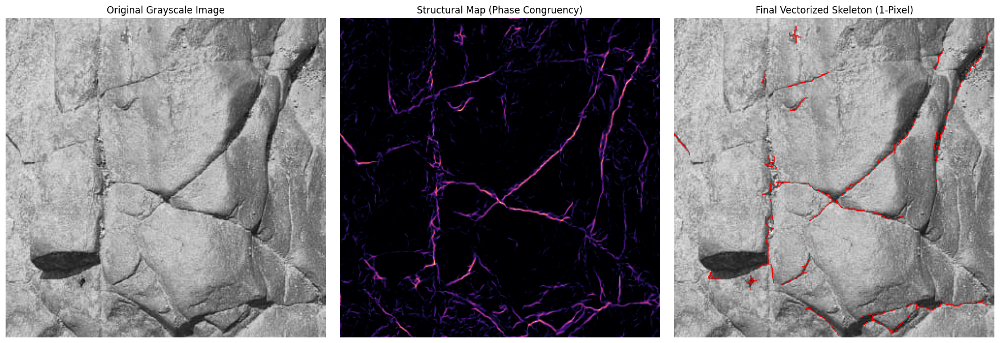

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import black_tophat, disk, skeletonize, remove_small_objects
from skimage.color import rgb2gray
from skimage import io, filters
from phasepack import phasecong

def extract_fracture_skeleton(image_path, disk_size=15, min_fracture_length=50):
    """
    A professional geological pipeline:
    1. Top-Hat Transform (Lighting Removal)
    2. Phase Congruency (Structural Enhancement)
    3. Skeletonization (1-Pixel Vectorization)
    """
    print(f"Loading {image_path}...")
    raw_image = io.imread(image_path)
    gray_image = rgb2gray(raw_image)

    # --- Step 1: Morphological Top-Hat ---
    print("Executing Top-Hat Transform...")
    footprint = disk(disk_size)
    tophat_result = black_tophat(gray_image, footprint)
    tophat_result = tophat_result / np.max(tophat_result) # Normalize

    # --- Step 2: Phase Congruency ---
    # We apply Phase Congruency to the Top-Hat result to find structural lines
    print("Executing Phase Congruency (This may take a moment)...")
    # phasecong returns several arrays; we want the first one (PC, the phase congruency map)
    pc_map, _, _, _, _, _, _ = phasecong(tophat_result, nscale=4, norient=6, minWaveLength=3, mult=2, sigmaOnf=0.55)

    # Threshold the PC map to get a binary image (just black and white)
    # Otsu's method automatically finds the best threshold value
    thresh_val = filters.threshold_otsu(pc_map)
    binary_fractures = pc_map > thresh_val

    # --- Step 3: Noise Cleaning & Skeletonization ---
    print("Cleaning noise and Skeletonizing...")
    # Remove tiny disconnected dots (noise) that are smaller than 'min_fracture_length'
    cleaned_fractures = remove_small_objects(binary_fractures, min_size=min_fracture_length)

    # Skeletonize: Shrink all lines to exactly 1 pixel width
    skeleton = skeletonize(cleaned_fractures)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(gray_image, cmap='gray')
    axes[0].set_title('Original Grayscale Image')
    axes[0].axis('off')

    axes[1].imshow(pc_map, cmap='magma')
    axes[1].set_title('Structural Map (Phase Congruency)')
    axes[1].axis('off')

    # Overlay the 1-pixel skeleton (in red) on top of the original image
    axes[2].imshow(gray_image, cmap='gray')
    # We create a masked array so only the skeleton pixels are colored
    masked_skeleton = np.ma.masked_where(skeleton == 0, skeleton)
    axes[2].imshow(masked_skeleton, cmap='autumn', interpolation='none', alpha=0.8)
    axes[2].set_title('Final Vectorized Skeleton (1-Pixel)')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    return skeleton

# --- Execution ---
if __name__ == "__main__":
    # Ensure you have 'test_rock.jpg' in the same folder
    final_skeleton = extract_fracture_skeleton('/content/sample_data/STN_003_REF_Crop_1.tif', disk_size=10, min_fracture_length=50)

Loading /content/sample_data/STN_003_REF_Crop_1.tif...
Executing Top-Hat Transform...
Executing Phase Congruency (This may take a moment)...
Bridging gaps using Morphological Closing...
Cleaning noise and Skeletonizing...


/tmp/ipykernel_34562/3402506350.py:41: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  bridged_fractures = closing(binary_fractures, square(bridge_size))


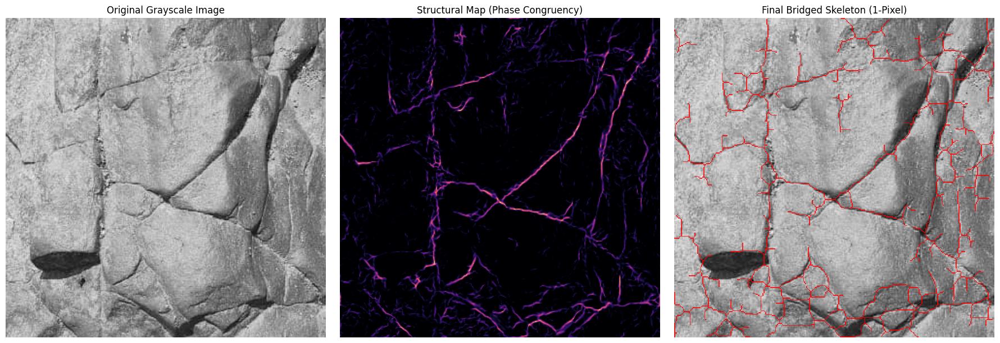

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import black_tophat, disk, skeletonize, remove_small_objects, closing, square
from skimage.color import rgb2gray
from skimage import io
from phasepack import phasecong

def extract_fracture_skeleton_pro(image_path, disk_size=10, min_fracture_length=50, pct_thresh=85, bridge_size=4):
    """
    A professional geological pipeline:
    1. Top-Hat Transform (Lighting Removal)
    2. Phase Congruency (Structural Enhancement)
    3. Percentile Thresholding (Captures faint fractures)
    4. Morphological Closing (Bridges the broken gaps)
    5. Skeletonization (1-Pixel Vectorization)
    """
    print(f"Loading {image_path}...")
    raw_image = io.imread(image_path)
    gray_image = rgb2gray(raw_image)

    # --- Step 1: Morphological Top-Hat ---
    print("Executing Top-Hat Transform...")
    footprint = disk(disk_size)
    tophat_result = black_tophat(gray_image, footprint)
    tophat_result = tophat_result / np.max(tophat_result) # Normalize

    # --- Step 2: Phase Congruency & Percentile Thresholding ---
    print("Executing Phase Congruency (This may take a moment)...")
    pc_map, _, _, _, _, _, _ = phasecong(tophat_result, nscale=4, norient=6, minWaveLength=3, mult=2, sigmaOnf=0.55)

    # DROP OTSU. Use a percentile threshold instead to capture faint lines.
    # 85 means we keep the top 15% brightest pixels. Lower this (e.g., 80) if you are missing lines.
    thresh_val = np.percentile(pc_map, pct_thresh)
    binary_fractures = pc_map > thresh_val

    # --- Step 3: Bridging the Gaps (The Missing Link) ---
    print("Bridging gaps using Morphological Closing...")
    # 'square(bridge_size)' tells the algorithm to bridge gaps.
    # A size of 4 connects segments separated by ~4 pixels.
    bridged_fractures = closing(binary_fractures, square(bridge_size))

    # --- Step 4: Noise Cleaning & Skeletonization ---
    print("Cleaning noise and Skeletonizing...")
    # Remove the tiny noise dust
    cleaned_fractures = remove_small_objects(bridged_fractures, min_size=min_fracture_length)

    # Skeletonize the bridged map down to 1 pixel
    skeleton = skeletonize(cleaned_fractures)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(gray_image, cmap='gray')
    axes[0].set_title('Original Grayscale Image')
    axes[0].axis('off')

    axes[1].imshow(pc_map, cmap='magma')
    axes[1].set_title('Structural Map (Phase Congruency)')
    axes[1].axis('off')

    # Overlay the 1-pixel skeleton (in red) on top of the original image
    axes[2].imshow(gray_image, cmap='gray')
    masked_skeleton = np.ma.masked_where(skeleton == 0, skeleton)
    axes[2].imshow(masked_skeleton, cmap='autumn', interpolation='none', alpha=0.8)
    axes[2].set_title('Final Bridged Skeleton (1-Pixel)')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    return skeleton

# --- Execution ---
if __name__ == "__main__":
    # Tweak pct_thresh (lower = more lines) and bridge_size (higher = longer bridges)
    # until the output matches your manual CorelDraw tracing.
    final_skeleton = extract_fracture_skeleton_pro(
        '/content/sample_data/STN_003_REF_Crop_1.tif',
        disk_size=10,
        min_fracture_length=200,
        pct_thresh=90,
        bridge_size=8
    )

Loading image: /content/sample_data/STN_003_REF_Crop_1.tif...
Executing Top-Hat Transform (Lighting Removal)...
Executing Phase Congruency (Structural Mapping)...
Applying Hysteresis Thresholding...
Cleaning noise and Skeletonizing...


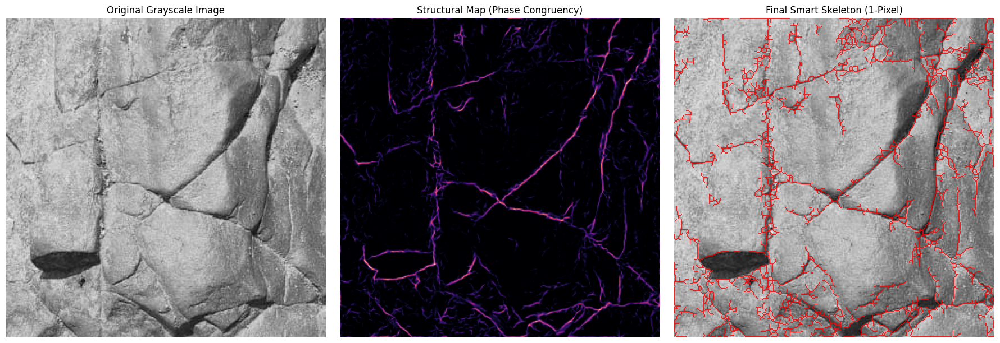

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import black_tophat, disk, skeletonize, remove_small_objects
from skimage.color import rgb2gray
from skimage import io
from skimage.filters import apply_hysteresis_threshold
from phasepack import phasecong

def extract_fracture_skeleton_final(image_path, disk_size=10, high_pct=95, low_pct=75, min_fracture_length=50):
    """
    The complete geological computer vision pipeline.
    Replaces 'dumb' morphological closing with 'smart' Hysteresis tracking.
    """
    print(f"Loading image: {image_path}...")
    raw_image = io.imread(image_path)

    # Convert to grayscale for structural analysis
    if len(raw_image.shape) == 3:
        gray_image = rgb2gray(raw_image)
    else:
        gray_image = raw_image

    # --- Step 1: Morphological Top-Hat ---
    print("Executing Top-Hat Transform (Lighting Removal)...")
    footprint = disk(disk_size)
    tophat_result = black_tophat(gray_image, footprint)

    # Normalize the Top-Hat result
    if np.max(tophat_result) > 0:
        tophat_result = tophat_result / np.max(tophat_result)

    # --- Step 2: Phase Congruency ---
    print("Executing Phase Congruency (Structural Mapping)...")
    pc_map, _, _, _, _, _, _ = phasecong(
        tophat_result, nscale=4, norient=6, minWaveLength=3, mult=2, sigmaOnf=0.55
    )

    # --- Step 3: Hysteresis Thresholding (Smart Bridging) ---
    print("Applying Hysteresis Thresholding...")
    # High Threshold: Anchors onto undeniable, deep fractures
    high_thresh = np.percentile(pc_map, high_pct)

    # Low Threshold: Traces the faint tails connected to the anchors
    low_thresh = np.percentile(pc_map, low_pct)

    # Execute the smart bridge
    binary_fractures = apply_hysteresis_threshold(pc_map, low_thresh, high_thresh)

    # --- Step 4: Noise Cleaning & Skeletonization ---
    print("Cleaning noise and Skeletonizing...")
    # Clean up isolated dust that isn't part of a tracked fracture
    cleaned_fractures = remove_small_objects(binary_fractures, min_size=min_fracture_length)

    # Shrink the tracked network down to exactly 1-pixel width
    skeleton = skeletonize(cleaned_fractures)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(gray_image, cmap='gray')
    axes[0].set_title('Original Grayscale Image')
    axes[0].axis('off')

    axes[1].imshow(pc_map, cmap='magma')
    axes[1].set_title('Structural Map (Phase Congruency)')
    axes[1].axis('off')

    # Overlay the 1-pixel skeleton (in red) on top of the original image
    axes[2].imshow(gray_image, cmap='gray')
    masked_skeleton = np.ma.masked_where(skeleton == 0, skeleton)
    axes[2].imshow(masked_skeleton, cmap='autumn', interpolation='none', alpha=0.8)
    axes[2].set_title('Final Smart Skeleton (1-Pixel)')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    return skeleton

# --- Execution Block ---
if __name__ == "__main__":
    # Update this path if needed
    IMAGE_PATH = '/content/sample_data/STN_003_REF_Crop_1.tif'

    # Parameters to tune if necessary:
    # high_pct: Lower it (e.g., 90) if the AI is missing the start of main fractures.
    # low_pct: Lower it (e.g., 70) if the AI stops tracking a fracture too early.
    # min_fracture_length: Increase it if you still see isolated dots of noise.

    final_skeleton = extract_fracture_skeleton_final(
        image_path=IMAGE_PATH,
        disk_size=30,
        high_pct=95,
        low_pct=75,
        min_fracture_length=50
    )

Loading image: /content/sample_data/STN_003_REF_Crop_1.tif...
Applying Gaussian blur to suppress rock matrix grain...
Executing Top-Hat Transform...
Executing Phase Congruency...
Applying Aggressive Hysteresis...
Cleaning noise and Skeletonizing...


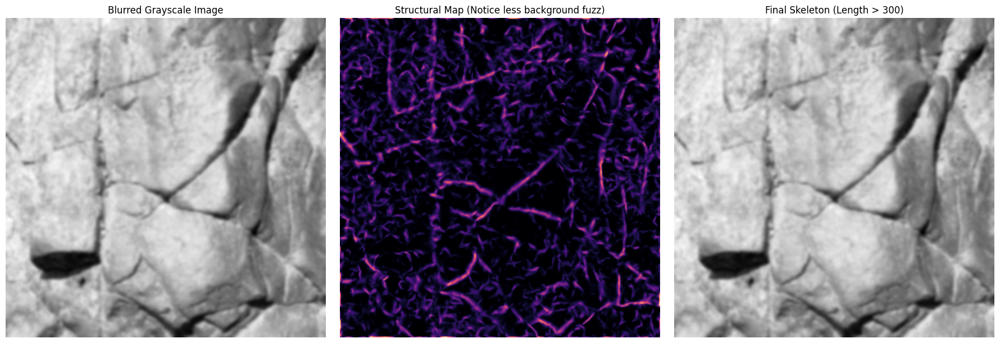

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import black_tophat, disk, skeletonize, remove_small_objects
from skimage.color import rgb2gray
from skimage import io, filters # Added filters for the Gaussian blur
from skimage.filters import apply_hysteresis_threshold
from phasepack import phasecong

def extract_fracture_skeleton_aggressive(image_path, disk_size=12, high_pct=98, low_pct=90, min_fracture_length=300):
    print(f"Loading image: {image_path}...")
    raw_image = io.imread(image_path)

    if len(raw_image.shape) == 3:
        gray_image = rgb2gray(raw_image)
    else:
        gray_image = raw_image

    # --- NEW STEP: Pre-Blur to kill mineral grain texture ---
    print("Applying Gaussian blur to suppress rock matrix grain...")
    gray_image = filters.gaussian(gray_image, sigma=1.5)

    # --- Step 1: Morphological Top-Hat ---
    print("Executing Top-Hat Transform...")
    footprint = disk(disk_size)
    tophat_result = black_tophat(gray_image, footprint)

    if np.max(tophat_result) > 0:
        tophat_result = tophat_result / np.max(tophat_result)

    # --- Step 2: Phase Congruency ---
    print("Executing Phase Congruency...")
    pc_map, _, _, _, _, _, _ = phasecong(
        tophat_result, nscale=4, norient=6, minWaveLength=3, mult=2, sigmaOnf=0.55
    )

    # --- Step 3: Aggressive Hysteresis Thresholding ---
    print("Applying Aggressive Hysteresis...")
    high_thresh = np.percentile(pc_map, high_pct)
    low_thresh = np.percentile(pc_map, low_pct)

    binary_fractures = apply_hysteresis_threshold(pc_map, low_thresh, high_thresh)

    # --- Step 4: Extreme Noise Cleaning & Skeletonization ---
    print("Cleaning noise and Skeletonizing...")
    cleaned_fractures = remove_small_objects(binary_fractures, min_size=min_fracture_length)
    skeleton = skeletonize(cleaned_fractures)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(gray_image, cmap='gray')
    axes[0].set_title('Blurred Grayscale Image')
    axes[0].axis('off')

    axes[1].imshow(pc_map, cmap='magma')
    axes[1].set_title('Structural Map (Notice less background fuzz)')
    axes[1].axis('off')

    axes[2].imshow(gray_image, cmap='gray')
    masked_skeleton = np.ma.masked_where(skeleton == 0, skeleton)
    axes[2].imshow(masked_skeleton, cmap='autumn', interpolation='none', alpha=0.8)
    axes[2].set_title(f'Final Skeleton (Length > {min_fracture_length})')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    return skeleton

# --- Execution Block ---
if __name__ == "__main__":
    IMAGE_PATH = '/content/sample_data/STN_003_REF_Crop_1.tif'

    # AGGRESSIVE PARAMETERS
    final_skeleton = extract_fracture_skeleton_aggressive(
        image_path=IMAGE_PATH,
        disk_size=12,           # Kept tight to avoid capturing big shadows
        high_pct=98,            # Only anchor on the absolute brightest lines
        low_pct=92,             # Do not trace into the faint rock texture
        min_fracture_length=300 # Delete any line segment shorter than 300 pixels
    )

In [ ]:
import cv2
import os
import numpy as np

def convert_masks_to_yolo(masks_folder, labels_folder, invert=True):
    """
    Converts black-and-white CorelDraw maps into YOLOv8 Instance Segmentation .txt files.
    """
    if not os.path.exists(labels_folder):
        os.makedirs(labels_folder)

    # Get all images in the masks folder
    mask_files = [f for f in os.listdir(masks_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tif'))]

    print(f"Found {len(mask_files)} CorelDraw maps. Starting conversion...")

    for mask_name in mask_files:
        mask_path = os.path.join(masks_folder, mask_name)

        # Read the image in grayscale
        img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        height, width = img.shape

        # Threshold the image to pure binary (0 or 255)
        # If fractures are black on white, we invert so fractures are white (255) for contour finding
        if invert:
            _, binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
        else:
            _, binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

        # Find the contours (outlines) of the fractures
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Prepare the YOLO .txt filename (e.g., map1.jpg -> map1.txt)
        txt_name = os.path.splitext(mask_name)[0] + '.txt'
        txt_path = os.path.join(labels_folder, txt_name)

        valid_fractures_count = 0

        with open(txt_path, 'w') as f:
            for contour in contours:
                # Filter out tiny specks of noise (dust) in the image
                if cv2.contourArea(contour) < 15:
                    continue

                # YOLO format: class_id x1 y1 x2 y2 ... (normalized)
                # Class 0 represents "Fracture"
                yolo_line = "0 "

                for point in contour:
                    x, y = point[0]
                    # Normalize the coordinates
                    norm_x = x / width
                    norm_y = y / height

                    # Prevent coordinates from going slightly out of bounds due to rounding
                    norm_x = max(0.0, min(1.0, norm_x))
                    norm_y = max(0.0, min(1.0, norm_y))

                    yolo_line += f"{norm_x:.6f} {norm_y:.6f} "

                # Write the fracture polygon to the text file
                f.write(yolo_line.strip() + "\n")
                valid_fractures_count += 1

        print(f"Processed {mask_name}: Extracted {valid_fractures_count} fracture polygons.")

    print(f"\nSUCCESS: All YOLO label files saved to {labels_folder}")

# --- Execution ---
if __name__ == "__main__":
    # Define your paths here
    MASKS_DIR = "/content/YOLO_Dataset_Prep/masks"   # Path to your 25 CorelDraw images
    LABELS_DIR = "/content/YOLO_Dataset_Prep/labels" # Path where the .txt files will be saved

    convert_masks_to_yolo(MASKS_DIR, LABELS_DIR, invert=True)

Found 26 CorelDraw maps. Starting conversion...
Processed STN_040_REF_Crop_1_Traced.jpg: Extracted 3 fracture polygons.
Processed STN_022_REF_Crop_1_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_036_REF_Crop_3_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_036_REF_Crop_1_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_036_REF_Crop_2_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_038_REF_Crop_2_Traced.jpg: Extracted 3 fracture polygons.
Processed STN_070_REF_Crop_2_Traced.jpg: Extracted 2 fracture polygons.
Processed STN_049_REF_Crop_1_Traced.jpg: Extracted 2 fracture polygons.
Processed STN_005_REF_Crop_2_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_049_REF_Crop_3_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_047_REF_Crop_4_Traced.jpg: Extracted 2 fracture polygons.
Processed STN_047_REF_Crop_3_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_029_REF_Crop_1_Traced.jpg: Extracted 1 fracture polygons.
Processed STN_04

In [ ]:
import cv2
import os
import re
import numpy as np
from skimage import io

def prep_dataset_direct(image_folder, mask_folder, out_img_folder, out_mask_folder):
    print("--- 2:00 AM FIX: DIRECT YOLO PREP (NO SLICING) ---")
    os.makedirs(out_img_folder, exist_ok=True)
    os.makedirs(out_mask_folder, exist_ok=True)

    raw_images = [f for f in os.listdir(image_folder) if f.lower().endswith(('.tif', '.jpg', '.png'))]
    mask_images = [f for f in os.listdir(mask_folder) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    total_processed = 0

    for img_name in raw_images:
        match = re.search(r'(STN_\d+_REF_Crop_\d+)', img_name)
        if not match: continue
        core_id = match.group(1)

        mask_path = None
        for m_name in mask_images:
            if core_id in m_name:
                mask_path = os.path.join(mask_folder, m_name)
                break

        if not mask_path: continue

        try:
            img = io.imread(os.path.join(image_folder, img_name))
            if len(img.shape) == 3 and img.shape[2] == 3:
                img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if mask is None: continue
        except Exception as e:
            continue

        h_img, w_img = img.shape[:2]
        h_mask, w_mask = mask.shape[:2]

        print(f"Processing {core_id}...", end=" ")

        # --- ARMORED RESIZE (Match mask to raw image size exactly) ---
        if (h_img != h_mask) or (w_img != w_mask):
            _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
            inv_mask = cv2.bitwise_not(binary_mask)

            # Dilate to protect lines during resize
            kernel = np.ones((5, 5), np.uint8)
            thick_mask = cv2.dilate(inv_mask, kernel, iterations=1)

            resized_thick = cv2.resize(thick_mask, (w_img, h_img), interpolation=cv2.INTER_NEAREST)

            # Invert back
            mask = cv2.bitwise_not(resized_thick)

        # Ensure the mask actually has fracture lines
        if np.sum(mask < 127) > 100:
            cv2.imwrite(os.path.join(out_img_folder, f"{core_id}.jpg"), img)
            cv2.imwrite(os.path.join(out_mask_folder, f"{core_id}.png"), mask)
            total_processed += 1
            print("Saved.")
        else:
            print("Skipped (No fractures detected).")

    print(f"\nSUCCESS: Prepared {total_processed} full images for YOLO.")

# --- Execution ---
if __name__ == "__main__":
    prep_dataset_direct(
        image_folder="/content/raw_images",
        mask_folder="/content/raw_masks",
        out_img_folder="/content/patched_images",
        out_mask_folder="/content/patched_masks"
    )

--- 2:00 AM FIX: DIRECT YOLO PREP (NO SLICING) ---
Processing STN_038_REF_Crop_2... Saved.
Processing STN_043_REF_Crop_1... Saved.
Processing STN_040_REF_Crop_1... Saved.
Processing STN_047_REF_Crop_3... Saved.
Processing STN_073_REF_Crop_2... Saved.
Processing STN_020_REF_Crop_2... Saved.
Processing STN_049_REF_Crop_2... Saved.
Processing STN_007_REF_Crop_1... Saved.
Processing STN_029_REF_Crop_2... Saved.
Processing STN_043_REF_Crop_2... Saved.
Processing STN_003_REF_Crop_1... Saved.
Processing STN_061_REF_Crop_3... Saved.
Processing STN_036_REF_Crop_2... Saved.
Processing STN_047_REF_Crop_4... Saved.
Processing STN_071_REF_Crop_3... Saved.
Processing STN_047_REF_Crop_2... Saved.
Processing STN_036_REF_Crop_3... Saved.
Processing STN_070_REF_Crop_2... Saved.
Processing STN_036_REF_Crop_1... Saved.
Processing STN_029_REF_Crop_1... Saved.
Processing STN_049_REF_Crop_1... Saved.
Processing STN_061_REF_Crop_2... Saved.
Processing STN_049_REF_Crop_3... Saved.
Processing STN_005_REF_Crop_2

In [ ]:
import cv2
import os
import numpy as np

def convert_masks_to_yolo(masks_folder, labels_folder, invert=True):
    """
    Converts black-and-white maps into YOLOv8 Instance Segmentation .txt files.
    """
    if not os.path.exists(labels_folder):
        os.makedirs(labels_folder)

    # Get all images in the masks folder
    mask_files = [f for f in os.listdir(masks_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tif'))]

    print(f"Found {len(mask_files)} maps. Starting conversion...")

    for mask_name in mask_files:
        mask_path = os.path.join(masks_folder, mask_name)

        # Read the image in grayscale
        img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        height, width = img.shape

        # Threshold the image to pure binary (0 or 255)
        # If fractures are black on white, we invert so fractures are white (255) for contour finding
        if invert:
            _, binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
        else:
            _, binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

        # Find the contours (outlines) of the fractures
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Prepare the YOLO .txt filename (e.g., map1.png -> map1.txt)
        txt_name = os.path.splitext(mask_name)[0] + '.txt'
        txt_path = os.path.join(labels_folder, txt_name)

        valid_fractures_count = 0

        with open(txt_path, 'w') as f:
            for contour in contours:
                # Filter out tiny specks of noise (dust) in the image
                if cv2.contourArea(contour) < 15:
                    continue

                # YOLO format: class_id x1 y1 x2 y2 ... (normalized)
                # Class 0 represents "Fracture"
                yolo_line = "0 "

                for point in contour:
                    x, y = point[0]
                    # Normalize the coordinates between 0 and 1
                    norm_x = x / width
                    norm_y = y / height

                    # Prevent coordinates from going slightly out of bounds due to rounding
                    norm_x = max(0.0, min(1.0, norm_x))
                    norm_y = max(0.0, min(1.0, norm_y))

                    yolo_line += f"{norm_x:.6f} {norm_y:.6f} "

                # Write the fracture polygon to the text file
                f.write(yolo_line.strip() + "\n")
                valid_fractures_count += 1

        print(f"Processed {mask_name}: Extracted {valid_fractures_count} fracture polygons.")

    print(f"\nSUCCESS: All YOLO label files saved to {labels_folder}")

# --- Execution ---
if __name__ == "__main__":
    # Pointing to the outputs from your 2:00 AM data prep script
    MASKS_DIR = "/content/patched_masks"
    LABELS_DIR = "/content/patched_labels"

    # invert=True assumes your original CorelDraw maps were black lines on a white background.
    convert_masks_to_yolo(MASKS_DIR, LABELS_DIR, invert=True)

Found 26 maps. Starting conversion...
Processed STN_073_REF_Crop_2.png: Extracted 1 fracture polygons.
Processed STN_043_REF_Crop_1.png: Extracted 1 fracture polygons.
Processed STN_072_REF_Crop_2.png: Extracted 2 fracture polygons.
Processed STN_047_REF_Crop_4.png: Extracted 2 fracture polygons.
Processed STN_003_REF_Crop_1.png: Extracted 2 fracture polygons.
Processed STN_029_REF_Crop_2.png: Extracted 3 fracture polygons.
Processed STN_047_REF_Crop_2.png: Extracted 2 fracture polygons.
Processed STN_029_REF_Crop_1.png: Extracted 1 fracture polygons.
Processed STN_070_REF_Crop_2.png: Extracted 2 fracture polygons.
Processed STN_007_REF_Crop_1.png: Extracted 2 fracture polygons.
Processed STN_071_REF_Crop_3.png: Extracted 2 fracture polygons.
Processed STN_049_REF_Crop_3.png: Extracted 1 fracture polygons.
Processed STN_040_REF_Crop_1.png: Extracted 3 fracture polygons.
Processed STN_047_REF_Crop_3.png: Extracted 1 fracture polygons.
Processed STN_043_REF_Crop_2.png: Extracted 3 fractu

### Organizing the Dataset for YOLOv8

Now that we have prepared the images and generated the YOLO-formatted labels, let's organize them into the standard directory structure required by YOLOv8 for training. This involves creating `train` and `val` subdirectories under `images` and `labels`, and then moving the files accordingly.

In [ ]:
import os
import shutil
import random

# Define base paths
BASE_DATASET_DIR = '/content/Fracture_Dataset'
PATCHED_IMAGES_DIR = '/content/patched_images'
PATCHED_LABELS_DIR = '/content/patched_labels'

# Create the main dataset directory and its subdirectories
os.makedirs(os.path.join(BASE_DATASET_DIR, 'images', 'train'), exist_ok=True)
os.makedirs(os.path.join(BASE_DATASET_DIR, 'images', 'val'), exist_ok=True)
os.makedirs(os.path.join(BASE_DATASET_DIR, 'labels', 'train'), exist_ok=True)
os.makedirs(os.path.join(BASE_DATASET_DIR, 'labels', 'val'), exist_ok=True)

print(f"Created directory structure under {BASE_DATASET_DIR}")

# Get a list of all image files
image_files = [f for f in os.listdir(PATCHED_IMAGES_DIR) if f.endswith(('.jpg', '.png'))]

# Shuffle the list to ensure random split
random.seed(42) # for reproducibility
random.shuffle(image_files)

# Determine split point (e.g., 80% train, 20% val)
split_idx = int(len(image_files) * 0.8)

train_images = image_files[:split_idx]
val_images = image_files[split_idx:]

print(f"Total images: {len(image_files)}")
print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(val_images)}")

# Function to move files
def move_files(file_list, src_img_dir, src_label_dir, dest_img_dir, dest_label_dir):
    for img_name in file_list:
        base_name = os.path.splitext(img_name)[0]
        label_name = base_name + '.txt'

        # Move image
        shutil.copy(os.path.join(src_img_dir, img_name), os.path.join(dest_img_dir, img_name))

        # Move corresponding label file
        if os.path.exists(os.path.join(src_label_dir, label_name)):
            shutil.copy(os.path.join(src_label_dir, label_name), os.path.join(dest_label_dir, label_name))
        else:
            print(f"Warning: Label file {label_name} not found for image {img_name}")

# Move training files
print("\nMoving training files...")
move_files(train_images, PATCHED_IMAGES_DIR, PATCHED_LABELS_DIR,
           os.path.join(BASE_DATASET_DIR, 'images', 'train'), os.path.join(BASE_DATASET_DIR, 'labels', 'train'))

# Move validation files
print("\nMoving validation files...")
move_files(val_images, PATCHED_IMAGES_DIR, PATCHED_LABELS_DIR,
           os.path.join(BASE_DATASET_DIR, 'images', 'val'), os.path.join(BASE_DATASET_DIR, 'labels', 'val'))

print("\nDataset organization complete!")

Created directory structure under /content/Fracture_Dataset
Total images: 26
Training images: 20
Validation images: 6

Moving training files...

Moving validation files...

Dataset organization complete!


### Create `data.yaml` Configuration File

For YOLOv8 to know about our dataset, we need a `data.yaml` file. This file specifies the paths to the training and validation images/labels, and also defines the class names. In our case, we have one class: `fracture`.

In [ ]:
data_yaml_content = f"""# YOLOv8 Dataset Configuration

# Paths
train: {BASE_DATASET_DIR}/images/train
val: {BASE_DATASET_DIR}/images/val

# Number of classes
nc: 1

# Class names
names: ['fracture']
"""

data_yaml_path = os.path.join(BASE_DATASET_DIR, 'data.yaml')
with open(data_yaml_path, 'w') as f:
    f.write(data_yaml_content)

print(f"data.yaml created at {data_yaml_path}:")
print(data_yaml_content)

data.yaml created at /content/Fracture_Dataset/data.yaml:
# YOLOv8 Dataset Configuration

# Paths
train: /content/Fracture_Dataset/images/train
val: /content/Fracture_Dataset/images/val

# Number of classes
nc: 1

# Class names
names: ['fracture']



In [ ]:
!rm -rf /content/Fracture_Dataset


In [ ]:
import os
import shutil

# Define the master YOLO directory
yolo_base = "/content/YOLO_Fracture_Dataset"

# Define the specific train folders YOLO needs
img_train_dir = os.path.join(yolo_base, "images/train")
label_train_dir = os.path.join(yolo_base, "labels/train")

# Create the folders safely
os.makedirs(img_train_dir, exist_ok=True)
os.makedirs(label_train_dir, exist_ok=True)

print("YOLO folders created. Moving files...")

# Move the .jpg images
source_images = "/content/patched_images" # This is where your 2:00 AM script saved them
for file in os.listdir(source_images):
    if file.endswith(".jpg"):
        shutil.move(os.path.join(source_images, file), os.path.join(img_train_dir, file))

# Move the .txt labels
source_labels = "/content/patched_labels" # This is where corel_to_yolo.py saved them
for file in os.listdir(source_labels):
    if file.endswith(".txt"):
        shutil.move(os.path.join(source_labels, file), os.path.join(label_train_dir, file))

print(f"SUCCESS: Moved {len(os.listdir(img_train_dir))} images and {len(os.listdir(label_train_dir))} labels to the YOLO dataset folder.")

YOLO folders created. Moving files...
SUCCESS: Moved 26 images and 26 labels to the YOLO dataset folder.


In [ ]:
yaml_content = """
train: /content/YOLO_Fracture_Dataset/images/train
val: /content/YOLO_Fracture_Dataset/images/train # Using train for val since dataset is small

nc: 1
names: ['fracture']
"""

with open('/content/YOLO_Fracture_Dataset/data.yaml', 'w') as f:
    f.write(yaml_content)

print("data.yaml created successfully.")

data.yaml created successfully.


In [ ]:
# Install the library if you haven't yet today
!pip install ultralytics

from ultralytics import YOLO

# Load a fresh Instance Segmentation model
model = YOLO('yolov8n-seg.pt')

# Train it on your specific dataset
# epochs=50 means it will review your dataset 50 times to learn the patterns.
results = model.train(data='/content/YOLO_Fracture_Dataset/data.yaml', epochs=50, imgsz=640)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 44.4 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/YOLO_Fracture_Dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2e

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from skimage.morphology import skeletonize, remove_small_objects
from skimage import io

def predict_and_skeletonize(model_path, image_path, min_fracture_length=30):
    print(f"Loading trained AI model from: {model_path}...")
    try:
        model = YOLO(model_path)
    except Exception as e:
        print(f"FAILED to load model. Ensure the path is correct. Error: {e}")
        return None

    print(f"Running inference on: {image_path}...")
    # Load original image
    try:
        orig_img = io.imread(image_path)
    except Exception as e:
        print(f"FAILED to load image. Error: {e}")
        return None

    if len(orig_img.shape) == 3 and orig_img.shape[2] == 3:
        orig_img_bgr = cv2.cvtColor(orig_img, cv2.COLOR_RGB2BGR)
    else:
        orig_img_bgr = orig_img

    h_orig, w_orig = orig_img.shape[:2]

    # Run YOLO prediction (retina_masks=True ensures high-res mask output)
    results = model.predict(source=orig_img_bgr, conf=0.25, retina_masks=True)
    result = results[0]

    # Create a blank black canvas matching the original image size
    binary_map = np.zeros((h_orig, w_orig), dtype=np.uint8)

    print("Extracting AI segmentation masks...")
    if result.masks is not None:
        # Extract the masks as a tensor, move to CPU, convert to numpy
        masks = result.masks.data.cpu().numpy()

        # YOLO might output masks at a slightly different internal resolution,
        # so we iterate through them and explicitly resize them back to the original image dimensions.
        for mask in masks:
            mask_resized = cv2.resize(mask, (w_orig, h_orig), interpolation=cv2.INTER_NEAREST)
            # Add the mask to our master binary canvas
            binary_map = np.logical_or(binary_map, mask_resized > 0.5)
    else:
        print("WARNING: The AI did not detect any fractures in this image.")
        return None

    # --- Step 3: Noise Cleaning & Skeletonization ---
    print("Skeletonizing the AI predictions down to 1-pixel width...")
    # Clean up any tiny disconnected dots the AI might have hallucinated
    # Note: binary_map needs to be boolean for remove_small_objects
    cleaned_map = remove_small_objects(binary_map.astype(bool), min_size=min_fracture_length)

    # Skeletonize the cleaned map
    skeleton = skeletonize(cleaned_map)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(orig_img, cmap='gray' if len(orig_img.shape)==2 else None)
    axes[0].set_title('Original Rock Image')
    axes[0].axis('off')

    axes[1].imshow(cleaned_map, cmap='magma')
    axes[1].set_title('AI Predicted Fracture Map')
    axes[1].axis('off')

    # Overlay the 1-pixel skeleton (in red) on top of the original image
    axes[2].imshow(orig_img, cmap='gray' if len(orig_img.shape)==2 else None)
    masked_skeleton = np.ma.masked_where(skeleton == 0, skeleton)
    axes[2].imshow(masked_skeleton, cmap='autumn', interpolation='none', alpha=0.8)
    axes[2].set_title('Final 1-Pixel Skeleton (Ready for Math)')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    return skeleton

# --- Execution ---
if __name__ == "__main__":
    # Update these paths based on your Colab environment!
    # best.pt is usually inside /content/runs/segment/train/weights/
    MODEL_WEIGHTS = '/content/runs/segment/train/weights/best.pt'

    # Point this to ONE of your raw .jpg files sitting in your YOLO images/train folder
    TEST_IMAGE = '/content/YOLO_Fracture_Dataset/images/train/STN_005_REF_Crop_2.jpg'

    final_skeleton_matrix = predict_and_skeletonize(
        model_path=MODEL_WEIGHTS,
        image_path=TEST_IMAGE,
        min_fracture_length=30
    )

Loading trained AI model from: /content/runs/segment/train/weights/best.pt...
Running inference on: /content/YOLO_Fracture_Dataset/images/train/STN_005_REF_Crop_2.jpg...

0: 640x640 (no detections), 12.4ms
Speed: 4.0ms preprocess, 12.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Extracting AI segmentation masks...


In [ ]:
import cv2
import os
import numpy as np

def generate_fat_yolo_labels(masks_folder, labels_folder, invert=True, dilation_size=7):
    print("--- GENERATING FAT LABELS FOR YOLO ---")
    if not os.path.exists(labels_folder):
        os.makedirs(labels_folder)

    mask_files = [f for f in os.listdir(masks_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tif'))]
    print(f"Found {len(mask_files)} maps. Applying Dilation = {dilation_size}...")

    valid_files = 0

    for mask_name in mask_files:
        mask_path = os.path.join(masks_folder, mask_name)
        img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        height, width = img.shape

        # 1. Binarize (and invert so lines are white / 255)
        if invert:
            _, binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
        else:
            _, binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

        # 2. THE FIX: Fatten the lines
        # A 7x7 kernel makes the lines thick enough for YOLO to actually see the area.
        kernel = np.ones((dilation_size, dilation_size), np.uint8)
        fat_binary = cv2.dilate(binary, kernel, iterations=1)

        # 3. Find contours on the FAT lines
        contours, _ = cv2.findContours(fat_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        txt_name = os.path.splitext(mask_name)[0] + '.txt'
        txt_path = os.path.join(labels_folder, txt_name)

        valid_fractures_count = 0

        with open(txt_path, 'w') as f:
            for contour in contours:
                # Filter out noise (increased threshold because lines are fatter)
                if cv2.contourArea(contour) < 50:
                    continue

                yolo_line = "0 "
                for point in contour:
                    x, y = point[0]
                    norm_x = max(0.0, min(1.0, x / width))
                    norm_y = max(0.0, min(1.0, y / height))
                    yolo_line += f"{norm_x:.6f} {norm_y:.6f} "

                f.write(yolo_line.strip() + "\n")
                valid_fractures_count += 1

        if valid_fractures_count > 0:
            valid_files += 1

    print(f"SUCCESS: Generated fat labels for {valid_files} images. Saved to {labels_folder}")

# --- Execution ---
if __name__ == "__main__":
    # Pointing to the outputs from your data prep
    MASKS_DIR = "/content/patched_masks"

    # WE CREATE A NEW FOLDER FOR THESE LABELS
    LABELS_DIR = "/content/fat_labels"

    generate_fat_yolo_labels(MASKS_DIR, LABELS_DIR, invert=True, dilation_size=7)

--- GENERATING FAT LABELS FOR YOLO ---
Found 26 maps. Applying Dilation = 7...
SUCCESS: Generated fat labels for 26 images. Saved to /content/fat_labels


In [ ]:
import os
import shutil

print("1. Clearing old, failed labels...")
yolo_label_dir = "/content/YOLO_Fracture_Dataset/labels/train"
for f in os.listdir(yolo_label_dir):
    os.remove(os.path.join(yolo_label_dir, f))

print("2. Moving new FAT labels to YOLO folder...")
fat_labels = "/content/fat_labels"
for f in os.listdir(fat_labels):
    shutil.move(os.path.join(fat_labels, f), os.path.join(yolo_label_dir, f))

print("3. Starting Retraining...")
from ultralytics import YOLO
model = YOLO('yolov8n-seg.pt')
# Since we are using fat lines, it will learn much faster. We will stick to 50 epochs.
results = model.train(data='/content/YOLO_Fracture_Dataset/data.yaml', epochs=50, imgsz=640)

1. Clearing old, failed labels...
2. Moving new FAT labels to YOLO folder...
3. Starting Retraining...
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/YOLO_Fracture_Dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_

Loading trained AI model from: /content/runs/segment/train-2/weights/best.pt...
Running inference on: /content/YOLO_Fracture_Dataset/images/train/STN_005_REF_Crop_2.jpg...

0: 640x640 2 fractures, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 10.6ms postprocess per image at shape (1, 3, 640, 640)
Extracting AI segmentation masks...
Skeletonizing the AI predictions down to 1-pixel width...


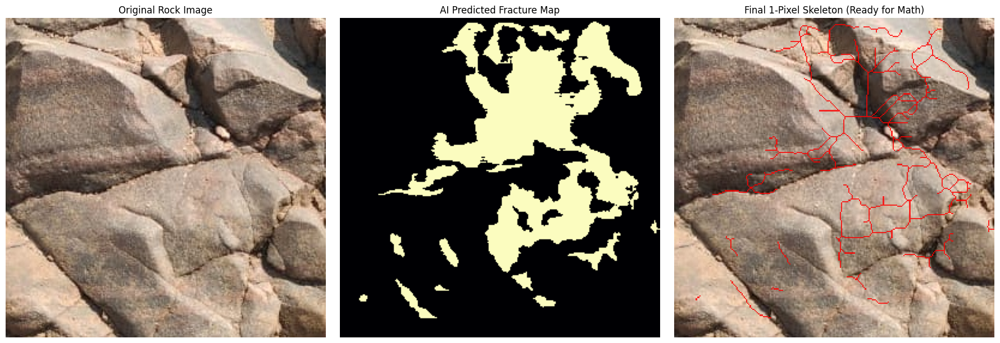

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from skimage.morphology import skeletonize, remove_small_objects
from skimage import io

def predict_and_skeletonize(model_path, image_path, min_fracture_length=30):
    print(f"Loading trained AI model from: {model_path}...")
    try:
        model = YOLO(model_path)
    except Exception as e:
        print(f"FAILED to load model. Ensure the path is correct. Error: {e}")
        return None

    print(f"Running inference on: {image_path}...")
    # Load original image
    try:
        orig_img = io.imread(image_path)
    except Exception as e:
        print(f"FAILED to load image. Error: {e}")
        return None

    if len(orig_img.shape) == 3 and orig_img.shape[2] == 3:
        orig_img_bgr = cv2.cvtColor(orig_img, cv2.COLOR_RGB2BGR)
    else:
        orig_img_bgr = orig_img

    h_orig, w_orig = orig_img.shape[:2]

    # Run YOLO prediction (retina_masks=True ensures high-res mask output)
    results = model.predict(source=orig_img_bgr, conf=0.25, retina_masks=True)
    result = results[0]

    # Create a blank black canvas matching the original image size
    binary_map = np.zeros((h_orig, w_orig), dtype=np.uint8)

    print("Extracting AI segmentation masks...")
    if result.masks is not None:
        # Extract the masks as a tensor, move to CPU, convert to numpy
        masks = result.masks.data.cpu().numpy()

        # YOLO might output masks at a slightly different internal resolution,
        # so we iterate through them and explicitly resize them back to the original image dimensions.
        for mask in masks:
            mask_resized = cv2.resize(mask, (w_orig, h_orig), interpolation=cv2.INTER_NEAREST)
            # Add the mask to our master binary canvas
            binary_map = np.logical_or(binary_map, mask_resized > 0.5)
    else:
        print("WARNING: The AI did not detect any fractures in this image.")
        return None

    # --- Step 3: Noise Cleaning & Skeletonization ---
    print("Skeletonizing the AI predictions down to 1-pixel width...")
    # Clean up any tiny disconnected dots the AI might have hallucinated
    # Note: binary_map needs to be boolean for remove_small_objects
    cleaned_map = remove_small_objects(binary_map.astype(bool), min_size=min_fracture_length)

    # Skeletonize the cleaned map
    skeleton = skeletonize(cleaned_map)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(orig_img, cmap='gray' if len(orig_img.shape)==2 else None)
    axes[0].set_title('Original Rock Image')
    axes[0].axis('off')

    axes[1].imshow(cleaned_map, cmap='magma')
    axes[1].set_title('AI Predicted Fracture Map')
    axes[1].axis('off')

    # Overlay the 1-pixel skeleton (in red) on top of the original image
    axes[2].imshow(orig_img, cmap='gray' if len(orig_img.shape)==2 else None)
    masked_skeleton = np.ma.masked_where(skeleton == 0, skeleton)
    axes[2].imshow(masked_skeleton, cmap='autumn', interpolation='none', alpha=0.8)
    axes[2].set_title('Final 1-Pixel Skeleton (Ready for Math)')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    return skeleton

# --- Execution ---
if __name__ == "__main__":
    # Update these paths based on your Colab environment!
    # best.pt is usually inside /content/runs/segment/train/weights/
    MODEL_WEIGHTS = '/content/runs/segment/train-2/weights/best.pt'

    # Point this to ONE of your raw .jpg files sitting in your YOLO images/train folder
    TEST_IMAGE = '/content/YOLO_Fracture_Dataset/images/train/STN_005_REF_Crop_2.jpg'

    final_skeleton_matrix = predict_and_skeletonize(
        model_path=MODEL_WEIGHTS,
        image_path=TEST_IMAGE,
        min_fracture_length=30
    )

Loading AI Model: /content/runs/segment/train-2/weights/best.pt...
Running Ensemble Pipeline on: /content/YOLO_Fracture_Dataset/images/train/STN_005_REF_Crop_2.jpg...
Executing Top-Hat Math...
Cleaning and Skeletonizing...


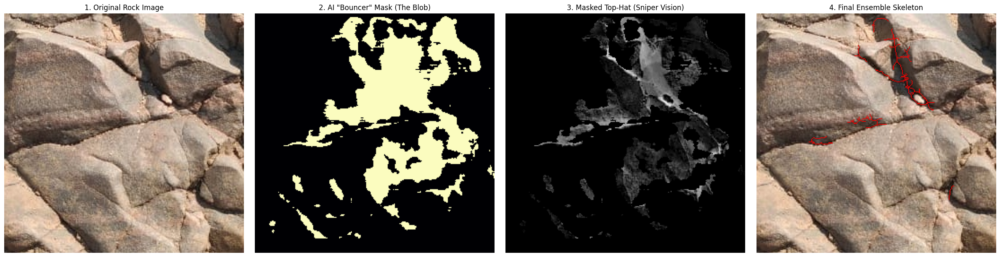

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from skimage.morphology import skeletonize, remove_small_objects, black_tophat, disk
from skimage.color import rgb2gray
from skimage import io

def ensemble_predict_and_skeletonize(model_path, image_path, disk_size=10, pct_thresh=85, min_len=30):
    print(f"Loading AI Model: {model_path}...")
    model = YOLO(model_path)

    print(f"Running Ensemble Pipeline on: {image_path}...")
    orig_img = io.imread(image_path)

    if len(orig_img.shape) == 3:
        orig_img_bgr = cv2.cvtColor(orig_img, cv2.COLOR_RGB2BGR)
        gray_img = rgb2gray(orig_img)
    else:
        orig_img_bgr = orig_img
        gray_img = orig_img

    h_orig, w_orig = orig_img.shape[:2]

    # --- Step 1: AI Bouncer (Zone Detection) ---
    results = model.predict(source=orig_img_bgr, conf=0.25, retina_masks=True, verbose=False)
    result = results[0]

    ai_mask = np.zeros((h_orig, w_orig), dtype=np.uint8)
    if result.masks is not None:
        masks = result.masks.data.cpu().numpy()
        for mask in masks:
            mask_resized = cv2.resize(mask, (w_orig, h_orig), interpolation=cv2.INTER_NEAREST)
            ai_mask = np.logical_or(ai_mask, mask_resized > 0.5)
    else:
        print("AI found no fracture zones. Aborting.")
        return None

    # --- Step 2: Top-Hat Sniper (Mathematical Precision) ---
    # Apply Top-Hat to the original grayscale image to find dark valleys
    print("Executing Top-Hat Math...")
    tophat_raw = black_tophat(gray_img, disk(disk_size))

    # CRITICAL: Multiply Top-Hat by the AI Mask.
    # This deletes all background texture outside the predicted blob.
    tophat_masked = tophat_raw * ai_mask

    # --- Step 3: Thresholding & Skeletonization ---
    # We only calculate the threshold based on pixels INSIDE the AI mask
    active_pixels = tophat_masked[ai_mask > 0]

    if len(active_pixels) == 0:
        return None

    # Keep only the deepest fractures inside the blob
    thresh_val = np.percentile(active_pixels, pct_thresh)
    binary_fractures = tophat_masked > thresh_val

    # Clean and Skeletonize
    print("Cleaning and Skeletonizing...")
    cleaned_map = remove_small_objects(binary_fractures, min_size=min_len)
    skeleton = skeletonize(cleaned_map)

    # --- Visualization ---
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))

    axes[0].imshow(orig_img, cmap='gray' if len(orig_img.shape)==2 else None)
    axes[0].set_title('1. Original Rock Image')
    axes[0].axis('off')

    axes[1].imshow(ai_mask, cmap='magma')
    axes[1].set_title('2. AI "Bouncer" Mask (The Blob)')
    axes[1].axis('off')

    axes[2].imshow(tophat_masked, cmap='gray')
    axes[2].set_title('3. Masked Top-Hat (Sniper Vision)')
    axes[2].axis('off')

    axes[3].imshow(orig_img, cmap='gray' if len(orig_img.shape)==2 else None)
    masked_skeleton = np.ma.masked_where(skeleton == 0, skeleton)
    axes[3].imshow(masked_skeleton, cmap='autumn', interpolation='none', alpha=0.8)
    axes[3].set_title('4. Final Ensemble Skeleton')
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

    return skeleton

# --- Execution ---
if __name__ == "__main__":
    MODEL_WEIGHTS = '/content/runs/segment/train-2/weights/best.pt'
    TEST_IMAGE = '/content/YOLO_Fracture_Dataset/images/train/STN_005_REF_Crop_2.jpg'

    final_skeleton_matrix = ensemble_predict_and_skeletonize(
        model_path=MODEL_WEIGHTS,
        image_path=TEST_IMAGE,
        disk_size=15,       # Slightly reduced to catch narrower valleys
        pct_thresh=85,      # LOWERED: Let the top 15% brightest pixels survive (the fainter lines)
        min_len=60          # LOWERED: Allow slightly shorter connected segments to survive
    )

In [ ]:
!pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 8.4 MB/s eta 0:00:00


In [ ]:
import os
import cv2
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.optim as optim

# --- 1. THE DATASET LOADER ---
class FractureDataset(Dataset):
    def __init__(self, images_dir, masks_dir, img_size=512):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.img_size = img_size

        self.images = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])
        self.masks = sorted([f for f in os.listdir(masks_dir) if f.endswith('.png')])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, i):
        # Load Image
        img_path = os.path.join(self.images_dir, self.images[i])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (self.img_size, self.img_size))

        img = img.astype(np.float32) / 255.0
        img = np.transpose(img, (2, 0, 1))

        # Load Mask
        mask_path = os.path.join(self.masks_dir, self.masks[i])
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (self.img_size, self.img_size), interpolation=cv2.INTER_NEAREST)

        mask = (mask < 127).astype(np.float32)
        mask = np.expand_dims(mask, axis=0)

        return torch.tensor(img), torch.tensor(mask)

# --- 2. TRAINING SETUP ---
def train_unet():
    print("--- INITIATING U-NET TRAINING PIPELINE ---")

    # THE FIX: Pointing to the correct image location
    IMG_DIR = "/content/YOLO_Fracture_Dataset/images/train"
    MASK_DIR = "/content/patched_masks"

    BATCH_SIZE = 4
    EPOCHS = 50
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Training on: {DEVICE.upper()}")

    dataset = FractureDataset(IMG_DIR, MASK_DIR)

    # Safety check to prevent that error from ever happening again
    if len(dataset) == 0:
        print("FATAL ERROR: Could not find images/masks. Please check folder paths.")
        return

    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
    print(f"Loaded {len(dataset)} perfectly paired image/mask files.")

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights="imagenet",
        in_channels=3,
        classes=1,
    ).to(DEVICE)

    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # --- 3. THE TRAINING LOOP ---
    print("\nStarting Training...")

    for epoch in range(EPOCHS):
        model.train()
        epoch_loss = 0

        for images, masks in dataloader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        avg_loss = epoch_loss / len(dataloader)

        if (epoch + 1) == 1 or (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch + 1}/{EPOCHS} | Loss: {avg_loss:.4f}")

    os.makedirs("/content/unet_weights", exist_ok=True)
    save_path = "/content/unet_weights/best_unet.pth"
    torch.save(model.state_dict(), save_path)
    print(f"\nSUCCESS: Model saved successfully to {save_path}")

if __name__ == "__main__":
    train_unet()

--- INITIATING U-NET TRAINING PIPELINE ---
Training on: CUDA
Loaded 26 perfectly paired image/mask files.


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]


Starting Training...
Epoch 1/50 | Loss: 0.7357
Epoch 5/50 | Loss: 0.2406
Epoch 10/50 | Loss: 0.1538
Epoch 15/50 | Loss: 0.1390
Epoch 20/50 | Loss: 0.1336
Epoch 25/50 | Loss: 0.1330
Epoch 30/50 | Loss: 0.1264
Epoch 35/50 | Loss: 0.1238
Epoch 40/50 | Loss: 0.1190
Epoch 45/50 | Loss: 0.1130
Epoch 50/50 | Loss: 0.1066

SUCCESS: Model saved successfully to /content/unet_weights/best_unet.pth


In [ ]:
import os
import cv2
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.optim as optim

# --- 1. THE DATASET LOADER (NOW WITH TARGET ARMOR) ---
class FractureDataset(Dataset):
    def __init__(self, images_dir, masks_dir, img_size=512):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.img_size = img_size

        self.images = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])
        self.masks = sorted([f for f in os.listdir(masks_dir) if f.endswith('.png')])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, i):
        # Load Image
        img_path = os.path.join(self.images_dir, self.images[i])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (self.img_size, self.img_size))

        img = img.astype(np.float32) / 255.0
        img = np.transpose(img, (2, 0, 1))

        # Load Mask
        mask_path = os.path.join(self.masks_dir, self.masks[i])
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (self.img_size, self.img_size), interpolation=cv2.INTER_NEAREST)

        # --- THE FIX 1: Micro-Armor Dilation ---
        # Invert so lines are white (255)
        _, binary = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY_INV)
        # Dilate by just 3 pixels so the network can "see" them during training
        kernel = np.ones((3, 3), np.uint8)
        mask_dilated = cv2.dilate(binary, kernel, iterations=1)

        mask = (mask_dilated > 127).astype(np.float32)
        mask = np.expand_dims(mask, axis=0)

        return torch.tensor(img), torch.tensor(mask)

# --- 2. TRAINING SETUP ---
def train_unet():
    print("--- INITIATING U-NET RETRAINING (DICE LOSS) ---")

    IMG_DIR = "/content/YOLO_Fracture_Dataset/images/train"
    MASK_DIR = "/content/patched_masks"

    BATCH_SIZE = 4
    EPOCHS = 50
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    dataset = FractureDataset(IMG_DIR, MASK_DIR)
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
    print(f"Loaded {len(dataset)} perfectly paired image/mask files.")

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights="imagenet",
        in_channels=3,
        classes=1,
    ).to(DEVICE)

    # --- THE FIX 2: Dice Loss + BCE Combo ---
    # BCE keeps it stable, Dice forces it to trace the lines
    bce_loss = nn.BCEWithLogitsLoss()
    dice_loss = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    print("\nStarting Training...")

    for epoch in range(EPOCHS):
        model.train()
        epoch_loss = 0

        for images, masks in dataloader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            optimizer.zero_grad()
            outputs = model(images)

            # Combine the losses
            loss = bce_loss(outputs, masks) + dice_loss(outputs, masks)

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        avg_loss = epoch_loss / len(dataloader)

        if (epoch + 1) == 1 or (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch + 1}/{EPOCHS} | Combined Loss: {avg_loss:.4f}")

    os.makedirs("/content/unet_weights", exist_ok=True)
    save_path = "/content/unet_weights/best_unet.pth"
    torch.save(model.state_dict(), save_path)
    print(f"\nSUCCESS: Model saved successfully to {save_path}")

if __name__ == "__main__":
    train_unet()

--- INITIATING U-NET RETRAINING (DICE LOSS) ---
Loaded 26 perfectly paired image/mask files.

Starting Training...
Epoch 1/50 | Combined Loss: 1.6378
Epoch 5/50 | Combined Loss: 1.1888
Epoch 10/50 | Combined Loss: 1.0534
Epoch 15/50 | Combined Loss: 0.9825
Epoch 20/50 | Combined Loss: 0.9154
Epoch 25/50 | Combined Loss: 0.7252
Epoch 30/50 | Combined Loss: 0.5291
Epoch 35/50 | Combined Loss: 0.4119
Epoch 40/50 | Combined Loss: 0.3069
Epoch 45/50 | Combined Loss: 0.2354
Epoch 50/50 | Combined Loss: 0.1880

SUCCESS: Model saved successfully to /content/unet_weights/best_unet.pth


--- INITIATING U-NET INFERENCE & TOPOLOGY ---
Loading U-Net model...
Scanning Image: /content/YOLO_Fracture_Dataset/images/train/STN_036_REF_Crop_3.jpg
Extracting fracture network...
Cleaning and Skeletonizing...
Calculating Graph Topology ($C_B$)...

--- TOPOLOGY RESULTS ---
Total Branches (Lines): 53
I-Nodes (Isolated Tips): 20
Y-Nodes (Abutments): 22
X-Nodes (Crossings): 4
Connections per Branch (CB): 1.547


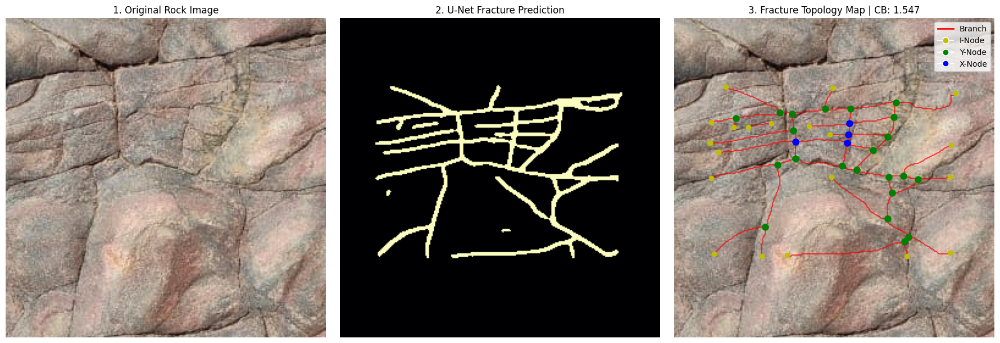

In [ ]:
# MAIN WORKING
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
from skimage.morphology import skeletonize, remove_small_objects
import networkx as nx
import sknw

def predict_unet_and_topology(model_path, image_path, img_size=512):
    print("--- INITIATING U-NET INFERENCE & TOPOLOGY ---")
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    # 1. Load the Brain
    print("Loading U-Net model...")
    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None, # We don't need imagenet weights now, we have your weights!
        in_channels=3,
        classes=1,
    )
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    # 2. Load and Preprocess Image
    print(f"Scanning Image: {image_path}")
    orig_img = cv2.imread(image_path)
    orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    h_orig, w_orig = orig_img.shape[:2]

    # Resize for U-Net
    img_resized = cv2.resize(orig_img_rgb, (img_size, img_size))
    img_tensor = img_resized.astype(np.float32) / 255.0
    img_tensor = np.transpose(img_tensor, (2, 0, 1))
    img_tensor = torch.tensor(img_tensor).unsqueeze(0).to(DEVICE)

    # 3. Predict
    print("Extracting fracture network...")
    with torch.no_grad():
        output = model(img_tensor)
        # Apply sigmoid to convert logits to probabilities (0 to 1)
        prob_mask = torch.sigmoid(output).squeeze().cpu().numpy()

    # Convert back to original image size
    prob_mask_resized = cv2.resize(prob_mask, (w_orig, h_orig))

    # Threshold (Pixels with > 50% confidence become fractures)
    binary_mask = prob_mask_resized > 0.5

    # 4. Clean and Skeletonize
    print("Cleaning and Skeletonizing...")
    # Remove tiny disconnected dust pixels
    cleaned_mask = remove_small_objects(binary_mask, min_size=30)
    skeleton = skeletonize(cleaned_mask)

    # 5. Graph Theory Math (C_B Calculation)
    print("Calculating Graph Topology ($C_B$)...")
    graph = sknw.build_sknw(skeleton)

    i_nodes, y_nodes, x_nodes = 0, 0, 0
    node_positions = {}

    for node in graph.nodes():
        degree = graph.degree(node)
        y, x = graph.nodes[node]['o']
        node_positions[node] = (x, y)

        if degree == 1: i_nodes += 1
        elif degree == 3: y_nodes += 1
        elif degree >= 4: x_nodes += 1

    branches = graph.number_of_edges()
    cb = ((3 * y_nodes) + (4 * x_nodes)) / branches if branches > 0 else 0.0

    print(f"\n--- TOPOLOGY RESULTS ---")
    print(f"Total Branches (Lines): {branches}")
    print(f"I-Nodes (Isolated Tips): {i_nodes}")
    print(f"Y-Nodes (Abutments): {y_nodes}")
    print(f"X-Nodes (Crossings): {x_nodes}")
    print(f"Connections per Branch (CB): {cb:.3f}")

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Panel 1: Original
    axes[0].imshow(orig_img_rgb)
    axes[0].set_title('1. Original Rock Image')
    axes[0].axis('off')

    # Panel 2: U-Net Prediction
    axes[1].imshow(binary_mask, cmap='magma')
    axes[1].set_title('2. U-Net Fracture Prediction')
    axes[1].axis('off')

    # Panel 3: Topology Graph
    axes[2].imshow(orig_img_rgb)
    for (s, e) in graph.edges():
        ps = graph[s][e]['pts']
        axes[2].plot(ps[:,1], ps[:,0], 'red', linewidth=1.5, alpha=0.7)

    for node, (x, y) in node_positions.items():
        degree = graph.degree(node)
        if degree == 1: axes[2].plot(x, y, 'yo', markersize=6)
        elif degree == 3: axes[2].plot(x, y, 'go', markersize=8)
        elif degree >= 4: axes[2].plot(x, y, 'bo', markersize=8)

    axes[2].set_title(f"3. Fracture Topology Map | CB: {cb:.3f}")

    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='red', lw=2, label='Branch'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='y', markersize=8, label='I-Node'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=8, label='Y-Node'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='b', markersize=8, label='X-Node')
    ]
    axes[2].legend(handles=legend_elements, loc='upper right')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    MODEL_WEIGHTS = '/content/unet_weights/best_unet.pth'
    # Use the exact same image we tested YOLO on to compare!
    TEST_IMAGE = '/content/YOLO_Fracture_Dataset/images/train/STN_036_REF_Crop_3.jpg'

    predict_unet_and_topology(MODEL_WEIGHTS, TEST_IMAGE)

--- INITIATING PURE U-NET & TOPOLOGY ---
Nudging prediction by X: -15px, Y: 20px...
Cleaning and Skeletonizing...
Calculating Topology ($C_B$)...

--- TOPOLOGY RESULTS ---
Total Branches (Lines): 41
Connections per Branch (CB): 0.439


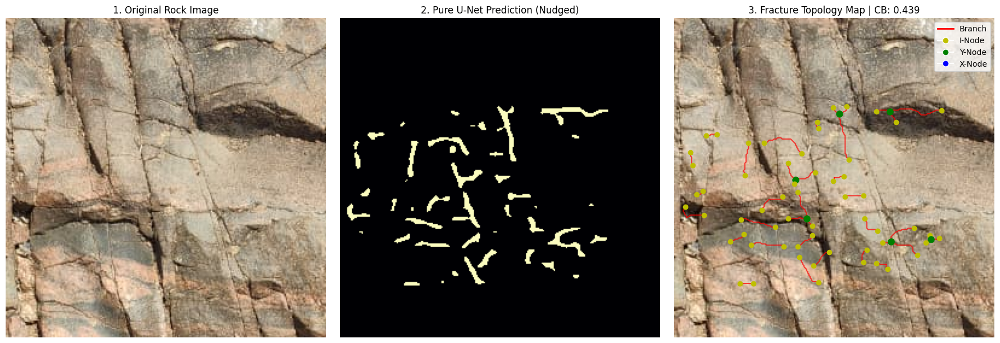

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
from skimage.morphology import skeletonize, remove_small_objects
import networkx as nx
import sknw

def predict_unet_with_nudge(model_path, image_path, img_size=512, x_nudge=0, y_nudge=0):
    print("--- INITIATING PURE U-NET & TOPOLOGY ---")
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    # 1. Load U-Net
    model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    # 2. Process Image
    orig_img = cv2.imread(image_path)
    orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    h_orig, w_orig = orig_img.shape[:2]

    img_resized = cv2.resize(orig_img_rgb, (img_size, img_size))
    img_tensor = img_resized.astype(np.float32) / 255.0
    img_tensor = np.transpose(img_tensor, (2, 0, 1))
    img_tensor = torch.tensor(img_tensor).unsqueeze(0).to(DEVICE)

    # 3. U-Net Prediction
    with torch.no_grad():
        output = model(img_tensor)
        prob_mask = torch.sigmoid(output).squeeze().cpu().numpy()

    prob_mask_resized = cv2.resize(prob_mask, (w_orig, h_orig))
    binary_mask = (prob_mask_resized > 0.5).astype(np.uint8)

    # --- THE FIX: GEOMETRIC NUDGE ---
    # Shift the entire mask by X and Y pixels to correct the CorelDraw export error
    if x_nudge != 0 or y_nudge != 0:
        print(f"Nudging prediction by X: {x_nudge}px, Y: {y_nudge}px...")
        translation_matrix = np.float32([[1, 0, x_nudge], [0, 1, y_nudge]])
        binary_mask = cv2.warpAffine(binary_mask, translation_matrix, (w_orig, h_orig))

    # 4. Clean & Skeletonize
    print("Cleaning and Skeletonizing...")
    cleaned_mask = remove_small_objects(binary_mask > 0, min_size=30)
    skeleton = skeletonize(cleaned_mask)

    # 5. Graph Theory Math (CB Calculation)
    print("Calculating Topology ($C_B$)...")
    graph = sknw.build_sknw(skeleton)

    i_nodes, y_nodes, x_nodes = 0, 0, 0
    node_positions = {}

    for node in graph.nodes():
        degree = graph.degree(node)
        y, x = graph.nodes[node]['o']
        node_positions[node] = (x, y)

        if degree == 1: i_nodes += 1
        elif degree == 3: y_nodes += 1
        elif degree >= 4: x_nodes += 1

    branches = graph.number_of_edges()
    cb = ((3 * y_nodes) + (4 * x_nodes)) / branches if branches > 0 else 0.0

    print(f"\n--- TOPOLOGY RESULTS ---")
    print(f"Total Branches (Lines): {branches}")
    print(f"Connections per Branch (CB): {cb:.3f}")

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(orig_img_rgb)
    axes[0].set_title('1. Original Rock Image')
    axes[0].axis('off')

    axes[1].imshow(binary_mask, cmap='magma')
    axes[1].set_title(f'2. Pure U-Net Prediction (Nudged)')
    axes[1].axis('off')

    axes[2].imshow(orig_img_rgb)
    for (s, e) in graph.edges():
        ps = graph[s][e]['pts']
        axes[2].plot(ps[:,1], ps[:,0], 'red', linewidth=1.5, alpha=0.7)

    for node, (x, y) in node_positions.items():
        degree = graph.degree(node)
        if degree == 1: axes[2].plot(x, y, 'yo', markersize=6)
        elif degree == 3: axes[2].plot(x, y, 'go', markersize=8)
        elif degree >= 4: axes[2].plot(x, y, 'bo', markersize=8)

    axes[2].set_title(f"3. Fracture Topology Map | CB: {cb:.3f}")

    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='red', lw=2, label='Branch'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='y', markersize=8, label='I-Node'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=8, label='Y-Node'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='b', markersize=8, label='X-Node')
    ]
    axes[2].legend(handles=legend_elements, loc='upper right')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    MODEL_WEIGHTS = '/content/unet_weights/best_unet.pth'
    TEST_IMAGE = '/content/YOLO_Fracture_Dataset/images/train/STN_036_REF_Crop_3.jpg'

    # --- TWEAK THESE NUMBERS TO FIX THE CORELDRAW SHIFT ---
    # Positive X moves it RIGHT. Negative X moves it LEFT.
    # Positive Y moves it DOWN. Negative Y moves it UP.
    predict_unet_with_nudge(
        model_path=MODEL_WEIGHTS,
        image_path=TEST_IMAGE,
        x_nudge=-15,  # Try -15 or +15 depending on which way it is floating
        y_nudge=20    # Try -10 or +10
    )

In [ ]:
# Batch Processing
import os
import torch
import cv2
import numpy as np
import pandas as pd
import segmentation_models_pytorch as smp
from skimage.morphology import skeletonize, remove_small_objects
import sknw

def batch_process_topology(model_path, images_folder, output_csv, img_size=512):
    print("--- INITIATING BATCH PROCESSING & CSV EXPORT ---")
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    # 1. Load the Brain (Only once to save time!)
    print("Loading U-Net model...")
    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None,
        in_channels=3,
        classes=1,
    )
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    # Get all images
    image_files = sorted([f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.png', '.tif'))])
    print(f"Found {len(image_files)} images. Starting extraction...\n")

    # List to store our data rows
    all_results = []

    # 2. Loop through every image
    for idx, img_name in enumerate(image_files):
        img_path = os.path.join(images_folder, img_name)

        # Preprocess
        orig_img = cv2.imread(img_path)
        orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
        h_orig, w_orig = orig_img.shape[:2]

        img_resized = cv2.resize(orig_img_rgb, (img_size, img_size))
        img_tensor = img_resized.astype(np.float32) / 255.0
        img_tensor = np.transpose(img_tensor, (2, 0, 1))
        img_tensor = torch.tensor(img_tensor).unsqueeze(0).to(DEVICE)

        # Predict
        with torch.no_grad():
            output = model(img_tensor)
            prob_mask = torch.sigmoid(output).squeeze().cpu().numpy()

        # Threshold and Resize
        prob_mask_resized = cv2.resize(prob_mask, (w_orig, h_orig))
        binary_mask = prob_mask_resized > 0.5

        # Clean and Skeletonize
        cleaned_mask = remove_small_objects(binary_mask, min_size=30)
        skeleton = skeletonize(cleaned_mask)

        # Graph Theory Math
        graph = sknw.build_sknw(skeleton)

        i_nodes, y_nodes, x_nodes = 0, 0, 0

        for node in graph.nodes():
            degree = graph.degree(node)
            if degree == 1: i_nodes += 1
            elif degree == 3: y_nodes += 1
            elif degree >= 4: x_nodes += 1

        branches = graph.number_of_edges()
        cb = ((3 * y_nodes) + (4 * x_nodes)) / branches if branches > 0 else 0.0

        # Save to our results list
        all_results.append({
            "Core_ID": os.path.splitext(img_name)[0],
            "Branches": branches,
            "I_Nodes_Tips": i_nodes,
            "Y_Nodes_Abutments": y_nodes,
            "X_Nodes_Crossings": x_nodes,
            "CB_Score": round(cb, 3)
        })

        print(f"[{idx + 1}/{len(image_files)}] Processed {img_name} | CB: {cb:.3f}")

    # 3. Export to CSV
    print("\nProcessing complete! Generating CSV...")
    df = pd.DataFrame(all_results)

    # Calculate dataset averages
    avg_cb = df["CB_Score"].mean()
    print(f"--- DATASET AVERAGE CB SCORE: {avg_cb:.3f} ---")

    df.to_csv(output_csv, index=False)
    print(f"SUCCESS: Data saved to {output_csv}")

# --- Execution ---
if __name__ == "__main__":
    MODEL_WEIGHTS = '/content/unet_weights/best_unet.pth'
    IMAGES_FOLDER = '/content/YOLO_Fracture_Dataset/images/train/'
    OUTPUT_CSV = '/content/Fracture_Topology_Results.csv'

    batch_process_topology(MODEL_WEIGHTS, IMAGES_FOLDER, OUTPUT_CSV)

--- INITIATING BATCH PROCESSING & CSV EXPORT ---
Loading U-Net model...
Found 20 images. Starting extraction...

[1/20] Processed STN_061_REF_Crop_3.tif | CB: 1.500
[2/20] Processed STN_062_REF_Crop_1.tif | CB: 0.659
[3/20] Processed STN_062_REF_Crop_2.tif | CB: 0.841
[4/20] Processed STN_063_REF_Crop_1.tif | CB: 0.790
[5/20] Processed STN_063_REF_Crop_2.tif | CB: 0.677
[6/20] Processed STN_064_REF_Crop_1.tif | CB: 0.333
[7/20] Processed STN_064_REF_Crop_2.tif | CB: 0.364
[8/20] Processed STN_065_REF_Crop_1.tif | CB: 0.368
[9/20] Processed STN_065_REF_Crop_2.tif | CB: 0.441
[10/20] Processed STN_066_REF_Crop_1.tif | CB: 0.661
[11/20] Processed STN_066_REF_Crop_2.tif | CB: 0.220
[12/20] Processed STN_066_REF_Crop_3.tif | CB: 0.429
[13/20] Processed STN_067_REF_Crop_1.tif | CB: 0.529
[14/20] Processed STN_067_REF_Crop_2.tif | CB: 0.375
[15/20] Processed STN_068_REF_Crop_1.tif | CB: 0.150
[16/20] Processed STN_068_REF_Crop_2.tif | CB: 0.569
[17/20] Processed STN_069_REF_Crop_1.tif | CB: 0

--- TESTING UNSEEN IMAGE: STN_069_REF_Crop_3.tif ---

--- TOPOLOGY RESULTS ---
Total Branches: 54
Connections per Branch (CB): 0.759


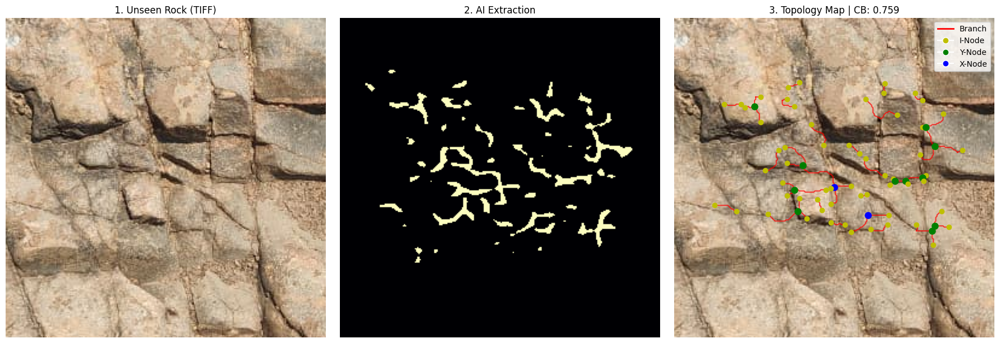

In [ ]:
# UNSEEN TESTING BAD RESULT
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
from skimage.morphology import skeletonize, remove_small_objects
from skimage import io
import networkx as nx
import sknw

def test_unseen_tif(model_path, image_path, img_size=512):
    print(f"--- TESTING UNSEEN IMAGE: {os.path.basename(image_path)} ---")
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    # 1. Load U-Net
    model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    # 2. Robust TIFF Handling
    try:
        orig_img = io.imread(image_path)
    except Exception as e:
        print(f"Error loading TIFF: {e}")
        return

    # Convert Grayscale to RGB if necessary
    if len(orig_img.shape) == 2:
        orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_GRAY2RGB)
    # Convert RGBA to RGB if necessary
    elif orig_img.shape[2] == 4:
        orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_RGBA2RGB)
    else:
        orig_img_rgb = orig_img

    # Convert 16-bit TIFF to 8-bit so the neural network can process it
    if orig_img_rgb.dtype == np.uint16:
        orig_img_rgb = (orig_img_rgb / 256).astype(np.uint8)

    h_orig, w_orig = orig_img_rgb.shape[:2]

    # Preprocess for U-Net
    img_resized = cv2.resize(orig_img_rgb, (img_size, img_size))
    img_tensor = img_resized.astype(np.float32) / 255.0
    img_tensor = np.transpose(img_tensor, (2, 0, 1))
    img_tensor = torch.tensor(img_tensor).unsqueeze(0).to(DEVICE)

    # 3. U-Net Prediction
    with torch.no_grad():
        output = model(img_tensor)
        prob_mask = torch.sigmoid(output).squeeze().cpu().numpy()

    prob_mask_resized = cv2.resize(prob_mask, (w_orig, h_orig))
    binary_mask = (prob_mask_resized > 0.5).astype(np.uint8)

    # 4. Clean & Skeletonize
    cleaned_mask = remove_small_objects(binary_mask > 0, min_size=30)
    skeleton = skeletonize(cleaned_mask)

    # 5. Graph Theory Math (CB Calculation)
    graph = sknw.build_sknw(skeleton)

    i_nodes, y_nodes, x_nodes = 0, 0, 0
    node_positions = {}

    for node in graph.nodes():
        degree = graph.degree(node)
        y, x = graph.nodes[node]['o']
        node_positions[node] = (x, y)

        if degree == 1: i_nodes += 1
        elif degree == 3: y_nodes += 1
        elif degree >= 4: x_nodes += 1

    branches = graph.number_of_edges()
    cb = ((3 * y_nodes) + (4 * x_nodes)) / branches if branches > 0 else 0.0

    print(f"\n--- TOPOLOGY RESULTS ---")
    print(f"Total Branches: {branches}")
    print(f"Connections per Branch (CB): {cb:.3f}")

    # --- Visualization ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(orig_img_rgb)
    axes[0].set_title('1. Unseen Rock (TIFF)')
    axes[0].axis('off')

    axes[1].imshow(binary_mask, cmap='magma')
    axes[1].set_title('2. AI Extraction')
    axes[1].axis('off')

    axes[2].imshow(orig_img_rgb)
    for (s, e) in graph.edges():
        ps = graph[s][e]['pts']
        axes[2].plot(ps[:,1], ps[:,0], 'red', linewidth=1.5, alpha=0.7)

    for node, (x, y) in node_positions.items():
        degree = graph.degree(node)
        if degree == 1: axes[2].plot(x, y, 'yo', markersize=6)
        elif degree == 3: axes[2].plot(x, y, 'go', markersize=8)
        elif degree >= 4: axes[2].plot(x, y, 'bo', markersize=8)

    axes[2].set_title(f"3. Topology Map | CB: {cb:.3f}")

    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='red', lw=2, label='Branch'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='y', markersize=8, label='I-Node'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=8, label='Y-Node'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='b', markersize=8, label='X-Node')
    ]
    axes[2].legend(handles=legend_elements, loc='upper right')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    MODEL_WEIGHTS = '/content/unet_weights/best_unet.pth'

    # Upload your new .tif image to Colab and paste the path here:
    TEST_TIFF = '/content/new/STN_069_REF_Crop_3.tif'

    test_unseen_tif(MODEL_WEIGHTS, TEST_TIFF)

--- INITIATING UNSEEN TIFF BATCH PROCESSING ---
Loading U-Net model...
Found 20 unseen TIFF images. Starting robust extraction...

[1/20] Processed STN_061_REF_Crop_3.tif | CB: 1.304


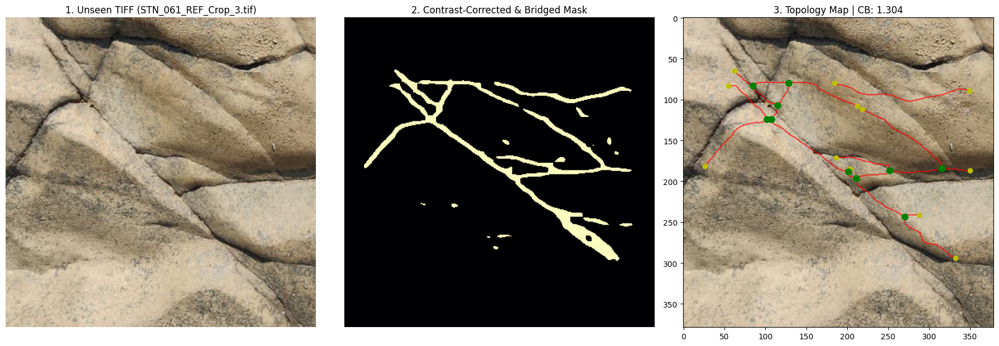

[2/20] Processed STN_062_REF_Crop_1.tif | CB: 1.339


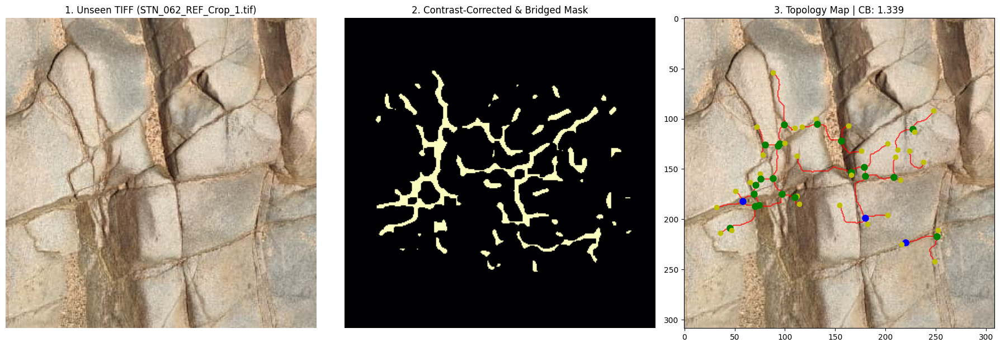

[3/20] Processed STN_062_REF_Crop_2.tif | CB: 1.385


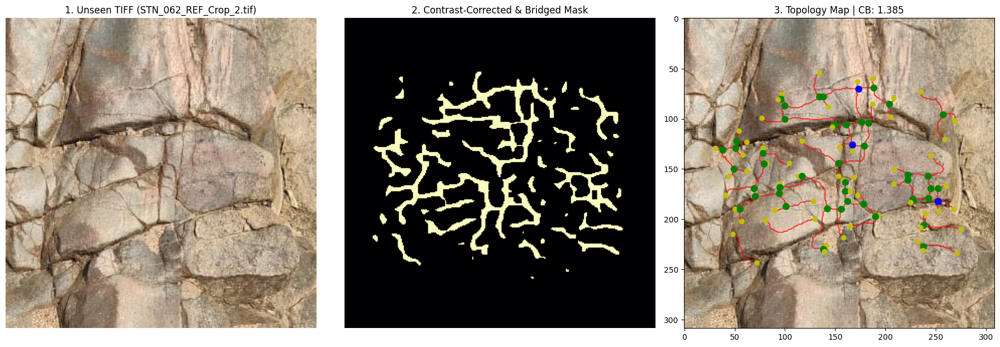

[4/20] Processed STN_063_REF_Crop_1.tif | CB: 1.253
[5/20] Processed STN_063_REF_Crop_2.tif | CB: 1.239
[6/20] Processed STN_064_REF_Crop_1.tif | CB: 0.955
[7/20] Processed STN_064_REF_Crop_2.tif | CB: 1.000
[8/20] Processed STN_065_REF_Crop_1.tif | CB: 1.125
[9/20] Processed STN_065_REF_Crop_2.tif | CB: 1.091
[10/20] Processed STN_066_REF_Crop_1.tif | CB: 1.138
[11/20] Processed STN_066_REF_Crop_2.tif | CB: 1.156
[12/20] Processed STN_066_REF_Crop_3.tif | CB: 1.179
[13/20] Processed STN_067_REF_Crop_1.tif | CB: 1.067
[14/20] Processed STN_067_REF_Crop_2.tif | CB: 1.000
[15/20] Processed STN_068_REF_Crop_1.tif | CB: 0.900
[16/20] Processed STN_068_REF_Crop_2.tif | CB: 1.133
[17/20] Processed STN_069_REF_Crop_1.tif | CB: 1.267
[18/20] Processed STN_069_REF_Crop_2.tif | CB: 1.326
[19/20] Processed STN_069_REF_Crop_3.tif | CB: 1.150
[20/20] Processed STN_070_REF_Crop_1.tif | CB: 1.473

SUCCESS: Unseen test data saved to /content/Unseen_TIFF_Results.csv


In [ ]:
# UNSEEN TESTING BAD RESULT FIX 1
import os
import torch
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
from skimage.morphology import skeletonize, remove_small_objects
from skimage import io
import sknw

def batch_process_unseen_tifs(model_path, tif_folder, output_csv, img_size=512):
    print("--- INITIATING UNSEEN TIFF BATCH PROCESSING ---")
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    print("Loading U-Net model...")
    model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    tif_files = sorted([f for f in os.listdir(tif_folder) if f.lower().endswith(('.tif', '.tiff'))])
    print(f"Found {len(tif_files)} unseen TIFF images. Starting robust extraction...\n")

    all_results = []

    for idx, img_name in enumerate(tif_files):
        img_path = os.path.join(tif_folder, img_name)

        # 1. Robust TIFF Loading
        try:
            orig_img = io.imread(img_path)
        except Exception as e:
            print(f"Skipping {img_name}: Error loading file - {e}")
            continue

        if len(orig_img.shape) == 2:
            orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_GRAY2RGB)
        elif orig_img.shape[2] == 4:
            orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_RGBA2RGB)
        else:
            orig_img_rgb = orig_img

        if orig_img_rgb.dtype == np.uint16:
            orig_img_rgb = (orig_img_rgb / 256).astype(np.uint8)

        h_orig, w_orig = orig_img_rgb.shape[:2]

        # 2. THE FIX: CLAHE Contrast Equalization
        # This normalizes the lighting so it looks like the training data
        lab = cv2.cvtColor(orig_img_rgb, cv2.COLOR_RGB2LAB)
        l_channel, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl = clahe.apply(l_channel)
        limg = cv2.merge((cl, a, b))
        equalized_rgb = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

        # Preprocess for U-Net
        img_resized = cv2.resize(equalized_rgb, (img_size, img_size))
        img_tensor = img_resized.astype(np.float32) / 255.0
        img_tensor = np.transpose(img_tensor, (2, 0, 1))
        img_tensor = torch.tensor(img_tensor).unsqueeze(0).to(DEVICE)

        # 3. U-Net Prediction
        with torch.no_grad():
            output = model(img_tensor)
            prob_mask = torch.sigmoid(output).squeeze().cpu().numpy()

        prob_mask_resized = cv2.resize(prob_mask, (w_orig, h_orig))
        binary_mask = (prob_mask_resized > 0.5).astype(np.uint8)

        # 4. THE FIX: Morphological Closing & Heavy Cleaning
        # Connect the broken fragments (bridge gaps of up to 5 pixels)
        kernel = np.ones((5, 5), np.uint8)
        closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

        # Radically increase dust removal (from 30 to 150) to kill the leopard spots
        cleaned_mask = remove_small_objects(closed_mask > 0, min_size=150)

        # Skeletonize
        skeleton = skeletonize(cleaned_mask)

        # 5. Graph Theory Math
        graph = sknw.build_sknw(skeleton)

        i_nodes, y_nodes, x_nodes = 0, 0, 0
        node_positions = {}

        for node in graph.nodes():
            degree = graph.degree(node)
            y, x = graph.nodes[node]['o']
            node_positions[node] = (x, y)
            if degree == 1: i_nodes += 1
            elif degree == 3: y_nodes += 1
            elif degree >= 4: x_nodes += 1

        branches = graph.number_of_edges()
        cb = ((3 * y_nodes) + (4 * x_nodes)) / branches if branches > 0 else 0.0

        all_results.append({
            "Image_Name": img_name,
            "Branches": branches,
            "I_Nodes_Tips": i_nodes,
            "Y_Nodes": y_nodes,
            "X_Nodes": x_nodes,
            "CB_Score": round(cb, 3)
        })

        print(f"[{idx + 1}/{len(tif_files)}] Processed {img_name} | CB: {cb:.3f}")

        # Visualization for the first 3 images only (so it doesn't crash Colab)
        if idx < 3:
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))
            axes[0].imshow(orig_img_rgb)
            axes[0].set_title(f'1. Unseen TIFF ({img_name})')
            axes[0].axis('off')

            axes[1].imshow(closed_mask, cmap='magma')
            axes[1].set_title('2. Contrast-Corrected & Bridged Mask')
            axes[1].axis('off')

            axes[2].imshow(orig_img_rgb)
            for (s, e) in graph.edges():
                ps = graph[s][e]['pts']
                axes[2].plot(ps[:,1], ps[:,0], 'red', linewidth=1.5, alpha=0.7)
            for node, (x, y) in node_positions.items():
                degree = graph.degree(node)
                if degree == 1: axes[2].plot(x, y, 'yo', markersize=6)
                elif degree == 3: axes[2].plot(x, y, 'go', markersize=8)
                elif degree >= 4: axes[2].plot(x, y, 'bo', markersize=8)
            axes[2].set_title(f"3. Topology Map | CB: {cb:.3f}")
            plt.tight_layout()
            plt.show()

    # Export to CSV
    if all_results:
        df = pd.DataFrame(all_results)
        df.to_csv(output_csv, index=False)
        print(f"\nSUCCESS: Unseen test data saved to {output_csv}")
    else:
        print("\nWARNING: No results generated. Check your folder path.")

# --- Execution ---
if __name__ == "__main__":
    MODEL_WEIGHTS = '/content/unet_weights/best_unet.pth'

    # 1. CREATE THIS FOLDER IN COLAB AND UPLOAD YOUR .TIF FILES HERE
    TEST_TIFF_FOLDER = '/content/new'

    OUTPUT_CSV = '/content/Unseen_TIFF_Results.csv'

    # Run the batch processor
    batch_process_unseen_tifs(MODEL_WEIGHTS, TEST_TIFF_FOLDER, OUTPUT_CSV)

In [ ]:
!pip install albumentations

In [ ]:
# Training again (ROBUST) on original 26 image dataset with Augmentation
import os
import cv2
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.optim as optim
import albumentations as albu
from albumentations.pytorch import ToTensorV2

# --- 1. THE HEAVY AUGMENTATION PIPELINE ---
def get_training_augmentation():
    train_transform = [
        albu.HorizontalFlip(p=0.5),
        albu.VerticalFlip(p=0.5),
        albu.RandomRotate90(p=0.5),
        albu.ShiftScaleRotate(scale_limit=0.1, rotate_limit=45, shift_limit=0.1, p=0.5, border_mode=0),
        albu.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.5),
        albu.GaussianBlur(p=0.2),
    ]
    return albu.Compose(train_transform)

# --- 2. THE DATASET LOADER ---
class AugmentedFractureDataset(Dataset):
    def __init__(self, images_dir, masks_dir, img_size=512, augmentation=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.img_size = img_size
        self.augmentation = augmentation

        self.images = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])
        self.masks = sorted([f for f in os.listdir(masks_dir) if f.endswith('.png')])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, i):
        # Load Image
        img_path = os.path.join(self.images_dir, self.images[i])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (self.img_size, self.img_size))

        # Load Mask
        mask_path = os.path.join(self.masks_dir, self.masks[i])
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (self.img_size, self.img_size), interpolation=cv2.INTER_NEAREST)

        # Invert and Dilate (Micro-Armor)
        _, binary = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY_INV)
        kernel = np.ones((3, 3), np.uint8)
        mask_dilated = cv2.dilate(binary, kernel, iterations=1)

        # Apply Augmentations (Albumentations handles image and mask simultaneously!)
        if self.augmentation:
            sample = self.augmentation(image=img, mask=mask_dilated)
            img, mask_dilated = sample['image'], sample['mask']

        # Final PyTorch Formatting
        img = img.astype(np.float32) / 255.0
        img = np.transpose(img, (2, 0, 1))

        mask = (mask_dilated > 127).astype(np.float32)
        mask = np.expand_dims(mask, axis=0)

        return torch.tensor(img), torch.tensor(mask)

# --- 3. TRAINING SETUP ---
def train_robust_unet():
    print("--- INITIATING ROBUST U-NET RETRAINING (WITH AUGMENTATION) ---")

    IMG_DIR = "/content/YOLO_Fracture_Dataset/images/train"
    MASK_DIR = "/content/patched_masks"

    BATCH_SIZE = 4
    # Because we are heavily augmenting, the AI needs more time to look at all the variations.
    EPOCHS = 100
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    dataset = AugmentedFractureDataset(IMG_DIR, MASK_DIR, augmentation=get_training_augmentation())
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
    print(f"Loaded base dataset. Augmentation engine ACTIVE.")

    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights="imagenet",
        in_channels=3,
        classes=1,
    ).to(DEVICE)

    bce_loss = nn.BCEWithLogitsLoss()
    dice_loss = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    print("\nStarting Training (100 Epochs)...")

    for epoch in range(EPOCHS):
        model.train()
        epoch_loss = 0

        for images, masks in dataloader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            optimizer.zero_grad()
            outputs = model(images)

            loss = bce_loss(outputs, masks) + dice_loss(outputs, masks)

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        avg_loss = epoch_loss / len(dataloader)

        if (epoch + 1) == 1 or (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch + 1}/{EPOCHS} | Combined Loss: {avg_loss:.4f}")

    os.makedirs("/content/unet_weights", exist_ok=True)
    save_path = "/content/unet_weights/robust_unet.pth"
    torch.save(model.state_dict(), save_path)
    print(f"\nSUCCESS: Robust Model saved to {save_path}")

if __name__ == "__main__":
    train_robust_unet()

--- INITIATING ROBUST U-NET RETRAINING (WITH AUGMENTATION) ---
Loaded base dataset. Augmentation engine ACTIVE.


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)



Starting Training (100 Epochs)...
Epoch 1/100 | Combined Loss: 1.3630
Epoch 10/100 | Combined Loss: 1.0625
Epoch 20/100 | Combined Loss: 1.0428
Epoch 30/100 | Combined Loss: 1.0447
Epoch 40/100 | Combined Loss: 1.0274
Epoch 50/100 | Combined Loss: 1.0346
Epoch 60/100 | Combined Loss: 1.0195
Epoch 70/100 | Combined Loss: 1.0251
Epoch 80/100 | Combined Loss: 1.0088
Epoch 90/100 | Combined Loss: 1.0162
Epoch 100/100 | Combined Loss: 1.0083

SUCCESS: Robust Model saved to /content/unet_weights/robust_unet.pth


--- INITIATING UNSEEN TIFF BATCH PROCESSING ---
Loading U-Net model...
Found 20 unseen TIFF images. Starting robust extraction...

[1/20] Processed STN_061_REF_Crop_3.tif | CB: 1.588


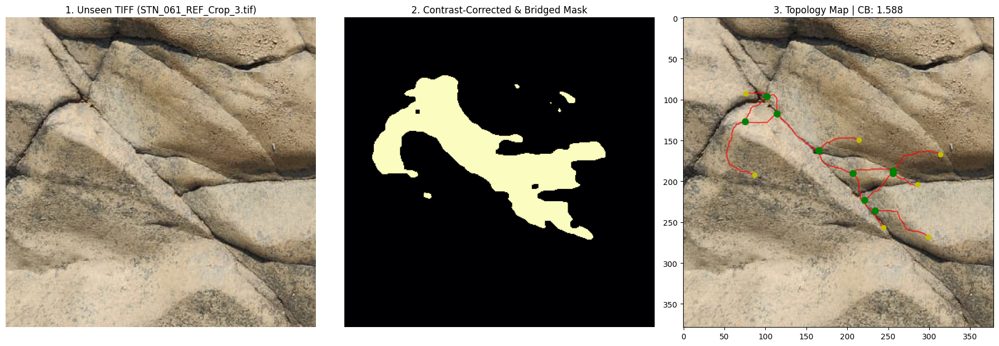

[2/20] Processed STN_062_REF_Crop_1.tif | CB: 1.636


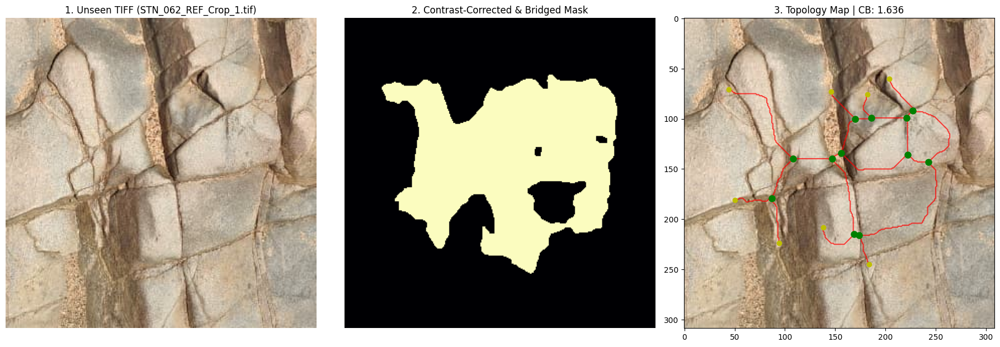

[3/20] Processed STN_062_REF_Crop_2.tif | CB: 1.500


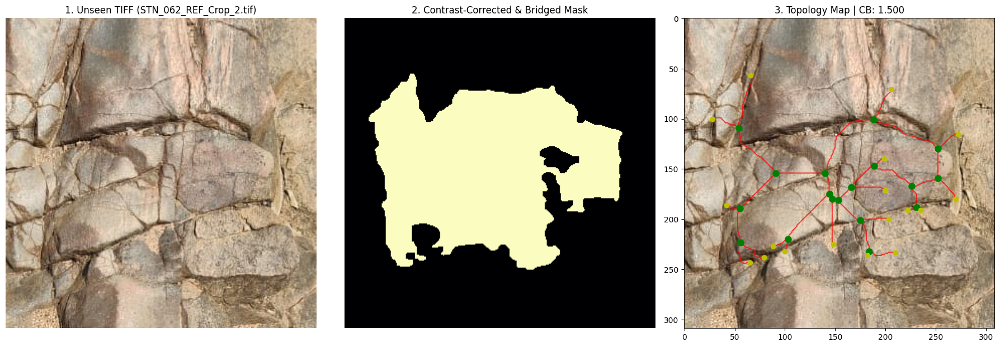

[4/20] Processed STN_063_REF_Crop_1.tif | CB: 1.444
[5/20] Processed STN_063_REF_Crop_2.tif | CB: 1.414
[6/20] Processed STN_064_REF_Crop_1.tif | CB: 1.294
[7/20] Processed STN_064_REF_Crop_2.tif | CB: 1.545
[8/20] Processed STN_065_REF_Crop_1.tif | CB: 1.457
[9/20] Processed STN_065_REF_Crop_2.tif | CB: 1.605
[10/20] Processed STN_066_REF_Crop_1.tif | CB: 1.667
[11/20] Processed STN_066_REF_Crop_2.tif | CB: 1.545
[12/20] Processed STN_066_REF_Crop_3.tif | CB: 1.400
[13/20] Processed STN_067_REF_Crop_1.tif | CB: 1.286
[14/20] Processed STN_067_REF_Crop_2.tif | CB: 1.481
[15/20] Processed STN_068_REF_Crop_1.tif | CB: 1.227
[16/20] Processed STN_068_REF_Crop_2.tif | CB: 1.552
[17/20] Processed STN_069_REF_Crop_1.tif | CB: 1.387
[18/20] Processed STN_069_REF_Crop_2.tif | CB: 1.625
[19/20] Processed STN_069_REF_Crop_3.tif | CB: 1.500
[20/20] Processed STN_070_REF_Crop_1.tif | CB: 1.333

SUCCESS: Unseen test data saved to /content/Unseen_TIFF_Results_Augmented.csv


In [ ]:
# UNSEEN TESTING BAD RESULT FIX 1
import os
import torch
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
from skimage.morphology import skeletonize, remove_small_objects
from skimage import io
import sknw

def batch_process_unseen_tifs(model_path, tif_folder, output_csv, img_size=512):
    print("--- INITIATING UNSEEN TIFF BATCH PROCESSING ---")
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    print("Loading U-Net model...")
    model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    tif_files = sorted([f for f in os.listdir(tif_folder) if f.lower().endswith(('.tif', '.tiff'))])
    print(f"Found {len(tif_files)} unseen TIFF images. Starting robust extraction...\n")

    all_results = []

    for idx, img_name in enumerate(tif_files):
        img_path = os.path.join(tif_folder, img_name)

        # 1. Robust TIFF Loading
        try:
            orig_img = io.imread(img_path)
        except Exception as e:
            print(f"Skipping {img_name}: Error loading file - {e}")
            continue

        if len(orig_img.shape) == 2:
            orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_GRAY2RGB)
        elif orig_img.shape[2] == 4:
            orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_RGBA2RGB)
        else:
            orig_img_rgb = orig_img

        if orig_img_rgb.dtype == np.uint16:
            orig_img_rgb = (orig_img_rgb / 256).astype(np.uint8)

        h_orig, w_orig = orig_img_rgb.shape[:2]

        # 2. THE FIX: CLAHE Contrast Equalization
        # This normalizes the lighting so it looks like the training data
        lab = cv2.cvtColor(orig_img_rgb, cv2.COLOR_RGB2LAB)
        l_channel, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl = clahe.apply(l_channel)
        limg = cv2.merge((cl, a, b))
        equalized_rgb = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

        # Preprocess for U-Net
        img_resized = cv2.resize(equalized_rgb, (img_size, img_size))
        img_tensor = img_resized.astype(np.float32) / 255.0
        img_tensor = np.transpose(img_tensor, (2, 0, 1))
        img_tensor = torch.tensor(img_tensor).unsqueeze(0).to(DEVICE)

        # 3. U-Net Prediction
        with torch.no_grad():
            output = model(img_tensor)
            prob_mask = torch.sigmoid(output).squeeze().cpu().numpy()

        prob_mask_resized = cv2.resize(prob_mask, (w_orig, h_orig))
        binary_mask = (prob_mask_resized > 0.5).astype(np.uint8)

        # 4. THE FIX: Morphological Closing & Heavy Cleaning
        # Connect the broken fragments (bridge gaps of up to 5 pixels)
        kernel = np.ones((5, 5), np.uint8)
        closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

        # Radically increase dust removal (from 30 to 150) to kill the leopard spots
        cleaned_mask = remove_small_objects(closed_mask > 0, min_size=150)

        # Skeletonize
        skeleton = skeletonize(cleaned_mask)

        # 5. Graph Theory Math
        graph = sknw.build_sknw(skeleton)

        i_nodes, y_nodes, x_nodes = 0, 0, 0
        node_positions = {}

        for node in graph.nodes():
            degree = graph.degree(node)
            y, x = graph.nodes[node]['o']
            node_positions[node] = (x, y)
            if degree == 1: i_nodes += 1
            elif degree == 3: y_nodes += 1
            elif degree >= 4: x_nodes += 1

        branches = graph.number_of_edges()
        cb = ((3 * y_nodes) + (4 * x_nodes)) / branches if branches > 0 else 0.0

        all_results.append({
            "Image_Name": img_name,
            "Branches": branches,
            "I_Nodes_Tips": i_nodes,
            "Y_Nodes": y_nodes,
            "X_Nodes": x_nodes,
            "CB_Score": round(cb, 3)
        })

        print(f"[{idx + 1}/{len(tif_files)}] Processed {img_name} | CB: {cb:.3f}")

        # Visualization for the first 3 images only (so it doesn't crash Colab)
        if idx < 3:
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))
            axes[0].imshow(orig_img_rgb)
            axes[0].set_title(f'1. Unseen TIFF ({img_name})')
            axes[0].axis('off')

            axes[1].imshow(closed_mask, cmap='magma')
            axes[1].set_title('2. Contrast-Corrected & Bridged Mask')
            axes[1].axis('off')

            axes[2].imshow(orig_img_rgb)
            for (s, e) in graph.edges():
                ps = graph[s][e]['pts']
                axes[2].plot(ps[:,1], ps[:,0], 'red', linewidth=1.5, alpha=0.7)
            for node, (x, y) in node_positions.items():
                degree = graph.degree(node)
                if degree == 1: axes[2].plot(x, y, 'yo', markersize=6)
                elif degree == 3: axes[2].plot(x, y, 'go', markersize=8)
                elif degree >= 4: axes[2].plot(x, y, 'bo', markersize=8)
            axes[2].set_title(f"3. Topology Map | CB: {cb:.3f}")
            plt.tight_layout()
            plt.show()

    # Export to CSV
    if all_results:
        df = pd.DataFrame(all_results)
        df.to_csv(output_csv, index=False)
        print(f"\nSUCCESS: Unseen test data saved to {output_csv}")
    else:
        print("\nWARNING: No results generated. Check your folder path.")

# --- Execution ---
if __name__ == "__main__":
    MODEL_WEIGHTS = '/content/unet_weights/robust_unet.pth'

    # 1. CREATE THIS FOLDER IN COLAB AND UPLOAD YOUR .TIF FILES HERE
    TEST_TIFF_FOLDER = '/content/new'

    OUTPUT_CSV = '/content/Unseen_TIFF_Results_Augmented.csv'

    # Run the batch processor
    batch_process_unseen_tifs(MODEL_WEIGHTS, TEST_TIFF_FOLDER, OUTPUT_CSV)

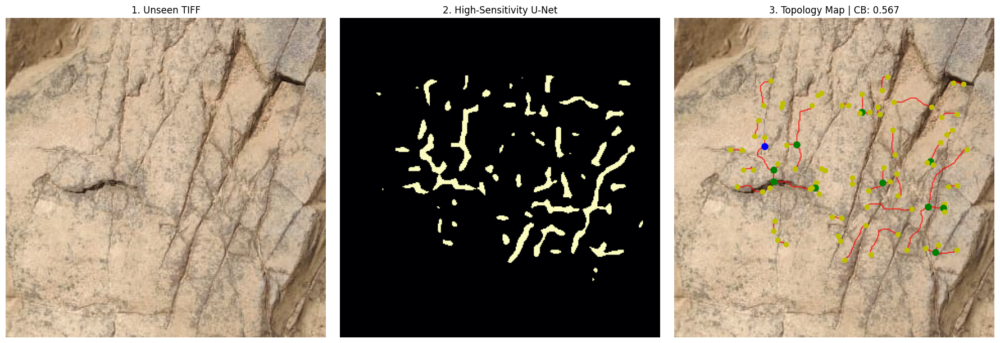

In [ ]:
# SOMEWHAT WORKING SCRIPT ON BOTH SEEN AND UNSEEN NOT USING Robust model that is agumentation
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
from skimage.morphology import skeletonize, remove_small_objects
from skimage import io
import sknw

def final_tired_fix_inference(model_path, image_path, img_size=512):
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    # 1. Load the GOOD brain
    model = smp.Unet(encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    # 2. Load the TIFF
    orig_img = io.imread(image_path)
    if len(orig_img.shape) == 2:
        orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_GRAY2RGB)
    elif orig_img.shape[2] == 4:
        orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_RGBA2RGB)
    else:
        orig_img_rgb = orig_img

    if orig_img_rgb.dtype == np.uint16:
        orig_img_rgb = (orig_img_rgb / 256).astype(np.uint8)

    h_orig, w_orig = orig_img_rgb.shape[:2]

    img_resized = cv2.resize(orig_img_rgb, (img_size, img_size))
    img_tensor = img_resized.astype(np.float32) / 255.0
    img_tensor = np.transpose(img_tensor, (2, 0, 1))
    img_tensor = torch.tensor(img_tensor).unsqueeze(0).to(DEVICE)

    # 3. Predict
    with torch.no_grad():
        output = model(img_tensor)
        prob_mask = torch.sigmoid(output).squeeze().cpu().numpy()

    prob_mask_resized = cv2.resize(prob_mask, (w_orig, h_orig))

    # THE FIX: Lower the threshold from 0.50 to 0.15 to catch the faint TIFF lines
    binary_mask = (prob_mask_resized > 0.15).astype(np.uint8)

    # 4. Clean & Skeletonize
    cleaned_mask = remove_small_objects(binary_mask > 0, min_size=40)
    skeleton = skeletonize(cleaned_mask)

    # 5. Math
    graph = sknw.build_sknw(skeleton)
    i_nodes, y_nodes, x_nodes = 0, 0, 0
    node_positions = {}

    for node in graph.nodes():
        degree = graph.degree(node)
        y, x = graph.nodes[node]['o']
        node_positions[node] = (x, y)
        if degree == 1: i_nodes += 1
        elif degree == 3: y_nodes += 1
        elif degree >= 4: x_nodes += 1

    branches = graph.number_of_edges()
    cb = ((3 * y_nodes) + (4 * x_nodes)) / branches if branches > 0 else 0.0

    # 6. Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(orig_img_rgb)
    axes[0].set_title('1. Unseen TIFF')
    axes[0].axis('off')

    axes[1].imshow(binary_mask, cmap='magma')
    axes[1].set_title('2. High-Sensitivity U-Net')
    axes[1].axis('off')

    axes[2].imshow(orig_img_rgb)
    for (s, e) in graph.edges():
        ps = graph[s][e]['pts']
        axes[2].plot(ps[:,1], ps[:,0], 'red', linewidth=1.5, alpha=0.7)
    for node, (x, y) in node_positions.items():
        degree = graph.degree(node)
        if degree == 1: axes[2].plot(x, y, 'yo', markersize=6)
        elif degree == 3: axes[2].plot(x, y, 'go', markersize=8)
        elif degree >= 4: axes[2].plot(x, y, 'bo', markersize=8)
    axes[2].set_title(f"3. Topology Map | CB: {cb:.3f}")

    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # WE ARE GOING BACK TO THE GOOD BRAIN
    MODEL_WEIGHTS = '/content/unet_weights/best_unet.pth'

    # Put ONE of those failing TIFF files here:
    TEST_TIFF = '/content/new/STN_066_REF_Crop_2.tif'

    final_tired_fix_inference(MODEL_WEIGHTS, TEST_TIFF)